## Supplemental figures associated with Figure 2 - Extended behavioral analysis

This script generates supplemental figures showing detailed behavioral training history,
performance across cohorts, and behavioral timeseries analysis.

In [1]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt

import seaborn as sns
sns.set_context('notebook', font_scale=1.5, rc={'lines.markeredgewidth': 2})

# Data access
from visual_behavior.data_access import loading as loading
from allensdk.brain_observatory.behavior.behavior_project_cache import VisualBehaviorOphysProjectCache

# Utilities
import visual_behavior.utilities as vbu
import visual_behavior.visualization.utils as utils
import visual_behavior.data_access.utilities as utilities
import visual_behavior.visualization.behavior

# Visualization modules
import visual_behavior.visualization.ophys.platform_paper_figures as ppf
import visual_behavior.visualization.ophys.summary_figures as sf
import visual_behavior.visualization.ophys.experiment_summary_figures as df


%load_ext autoreload
%autoreload 2
%matplotlib inline

ERROR:tornado.general:Uncaught exception in ZMQStream callback
Traceback (most recent call last):
  File "/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/traitlets/traitlets.py", line 632, in get
    value = obj._trait_values[self.name]
KeyError: '_control_lock'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/zmq/eventloop/zmqstream.py", line 565, in _log_error
    f.result()
  File "/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/ipykernel/kernelbase.py", line 301, in dispatch_control
    async with self._control_lock:
  File "/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/traitlets/traitlets.py", line 687, in __get__
    return t.cast(G, self.get(obj, cls))  # the G should encode the Optional
  File "/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/traitlets/traitlets.p

In [2]:
save_dir = os.path.join(loading.get_figures_save_dir(), 'platform_paper_figures', 'figure_2_supplemental')
if os.path.exists(save_dir) == False:
    os.makedirs(save_dir)
folder = 'behavior_metrics'

### Data Loading

#### Metadata tables

In [3]:
# AllenSDK cache
from pandas.core.frame import DataFrame


platform_cache_dir = loading.get_platform_analysis_cache_dir()
cache = loading._get_cache()

# Full experiment table from SDK (needed for ophys history in S5)
all_experiments_table = cache.get_ophys_experiment_table()

# Curated metadata tables
metadata_tables_dir = loading.get_metadata_tables_dir()
platform_experiments = pd.read_csv(os.path.join(metadata_tables_dir, 'platform_paper_ophys_experiments_table.csv'), index_col=0)
platform_cells_table = pd.read_csv(os.path.join(metadata_tables_dir, 'platform_paper_ophys_cells_table.csv'), index_col=0)

# All mice in dataset
all_behavior_sessions = pd.read_csv(os.path.join(loading.get_platform_analysis_cache_dir(), 'all_behavior_sessions_table.csv'), index_col=0)
all_behavior_sessions['mouse_id'] = [int(mouse_id) for mouse_id in all_behavior_sessions.mouse_id.values]

# Drop metrics cols because we will get them elsewhere
cols_to_drop = ['engaged_trial_count',
       'false_alarm_trial_count', 'trial_count', 'go_trial_count',
       'correct_reject_trial_count', 'catch_trial_count', 'file_id',
       'hit_trial_count', 'miss_trial_count',]

# Only mice included in this study (i.e. excluding project code VisualBehaviorMultiscope4areasx2d)
platform_behavior_sessions = pd.read_csv(os.path.join(loading.get_platform_analysis_cache_dir(), 'platform_behavior_sessions_table.csv'), index_col=0)
platform_behavior_sessions = platform_behavior_sessions.drop(columns=cols_to_drop)
platform_behavior_sessions = utilities.add_behavior_stage_to_behavior_sessions(platform_behavior_sessions)
platform_behavior_sessions['mouse_id'] = [int(mouse_id) for mouse_id in platform_behavior_sessions.mouse_id.values]

# Limited to sessions with ophys data
platform_ophys_behavior_sessions = pd.read_csv(os.path.join(loading.get_platform_analysis_cache_dir(), 'platform_ophys_behavior_sessions_table.csv'), index_col=0)
platform_ophys_behavior_sessions = platform_ophys_behavior_sessions.drop(columns=cols_to_drop)
platform_ophys_behavior_sessions['mouse_id'] = [int(mouse_id) for mouse_id in platform_ophys_behavior_sessions.mouse_id.values]

# Save to more convenient name
behavior_sessions: DataFrame = platform_behavior_sessions.copy()

# Cre lines, cell types, and palette for plotting
cre_lines = np.sort(platform_cells_table.cre_line.unique())
cell_types = utils.get_cell_types()
experience_levels = utils.get_experience_levels()
palette = utils.get_experience_level_colors()


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

['Training' 'Familiar' 'Novel' 'Novel +']


In [4]:
print(len(all_behavior_sessions.mouse_id.unique()), 'mice')
print(len(all_behavior_sessions.index.unique()), 'behavior sessions')

107 mice
4782 behavior sessions


In [5]:
print(len(behavior_sessions.mouse_id.unique()), 'mice')
print(len(behavior_sessions.index.unique()), 'behavior sessions')
print((behavior_sessions.behavior_stage.unique()), 'behavior stages')


66 mice
2942 behavior sessions
['gratings_static_training' 'gratings_flashed_training'
 'familiar_images_training' 'familiar_images_ophys'
 'familiar_images_ophys_passive' 'novel_images_ophys'
 'novel +_images_ophys_passive' 'novel +_images_ophys'] behavior stages


In [6]:
print(len(platform_ophys_behavior_sessions.mouse_id.unique()), 'mice')
print(len(platform_ophys_behavior_sessions.ophys_experiment_id.unique()), 'experiments')
print(len(platform_ophys_behavior_sessions.ophys_session_id.unique()), 'ophys sessions')
print(len(platform_ophys_behavior_sessions.index.unique()), 'behavior sessions')
print((platform_ophys_behavior_sessions.behavior_stage.unique()), 'behavior stages')


66 mice
202 experiments
202 ophys sessions
202 behavior sessions
['familiar_images_ophys' 'novel 1_images_ophys' 'novel >1_images_ophys'] behavior stages


#### Behavior metrics

In [29]:
behavior_metrics_dir = loading.get_performance_metrics_dir()

# Behavior metrics computed by AllenSDK
behavior_stats_sdk = pd.read_hdf(os.path.join(behavior_metrics_dir, 'sdk_all_sessions.h5'), key='data')
behavior_stats_sdk.index.name = 'behavior_session_id'
behavior_stats_sdk = behavior_stats_sdk.reset_index()  # move behavior_session_id from index to column
behavior_stats_sdk = behavior_stats_sdk.merge(behavior_sessions, on='behavior_session_id', how='left')
# Limit to platform paper mice 
behavior_stats_sdk = behavior_stats_sdk[behavior_stats_sdk.mouse_id.isin(platform_behavior_sessions.mouse_id.unique())]
behavior_stats_sdk['mouse_id'] = [int(mouse_id) for mouse_id in behavior_stats_sdk.mouse_id.values]

# Behavior metrics computed on a flash by flash basis, limited to engaged portions of session
engaged_behavior_stats_stim = pd.read_hdf(os.path.join(behavior_metrics_dir, 'stimulus_based_engaged_only_all_sessions.h5'), key='data')
engaged_behavior_stats_stim = engaged_behavior_stats_stim.merge(behavior_sessions, on='behavior_session_id', how='left')
# Limit to platform paper mice 
engaged_behavior_stats_stim = engaged_behavior_stats_stim[engaged_behavior_stats_stim.behavior_session_id.isin(platform_behavior_sessions.index.unique())]


# Behavior metrics computed on a flash by flash basis, limited to engaged portions of session
behavior_stats_stim = pd.read_hdf(os.path.join(behavior_metrics_dir, 'stimulus_based_all_sessions.h5'), key='data')
behavior_stats_stim = behavior_stats_stim.merge(behavior_sessions, on='behavior_session_id', how='left')
# Limit to platform paper mice 
behavior_stats_stim = behavior_stats_stim[behavior_stats_stim.behavior_session_id.isin(platform_behavior_sessions.index.unique())]


# Load platform behavior stats for stimulus-based metrics
platform_behavior_stats = pd.read_csv(os.path.join(behavior_metrics_dir,  'platform_behavior_stats_engaged.csv'), index_col=0)
platform_behavior_stats = platform_behavior_stats.merge(behavior_sessions, on='behavior_session_id', how='left')
# Limit to platform paper mice 
platform_behavior_stats = platform_behavior_stats[platform_behavior_stats.behavior_session_id.isin(platform_behavior_sessions.index.unique())]


In [8]:
# print(len(platform_behavior_sessions.mouse_id.unique()), 'mice')
# print(len(platform_behavior_sessions.index.unique()), 'behavior sessions')


In [9]:
# print(len(behavior_stats_sdk.mouse_id.unique()), 'mice')
# print(len(behavior_stats_sdk.index.unique()), 'behavior sessions')


In [10]:
# print(len(engaged_behavior_stats_stim.mouse_id.unique()), 'mice')
# print(len(engaged_behavior_stats_stim.behavior_session_id.unique()), 'behavior sessions')


### Image sets

Display the stimulus images for each image set. One helper (`plot_image_set`) is reused for every set.

In [11]:
def plot_image_set(stimulus_templates, title, title_color, vmin=None, vmax=None,
                   save_dir=None, folder='image_sets', filename=None):
    """Display the images of a stimulus set in a 2x4 grid (shared layout for all image-set panels)."""
    figsize = (8, 4)
    fig, ax = plt.subplots(2, 4, figsize=figsize)
    ax = ax.ravel()
    imshow_kw = {} if vmin is None else dict(vmin=vmin, vmax=vmax)
    for i, image_name in enumerate(np.sort(stimulus_templates.index)):
        image = stimulus_templates.loc[image_name]['unwarped'].copy()
        image[np.isnan(image)] = 150
        ax[i].imshow(image, cmap='gray', **imshow_kw)
        ax[i].set_title(image_name, fontsize=14)
        ax[i].set_xlim(480, 1400)
        ax[i].set_ylim(220, 980)
        ax[i].invert_yaxis()
        ax[i].axis('off')
    fig.suptitle(title, x=0.51, y=1.01, color=title_color, fontsize=20)
    plt.subplots_adjust(hspace=0.1, wspace=0.1)
    if save_dir is not None and filename is not None:
        utils.save_figure(fig, figsize, save_dir, folder, filename, formats=['.png', '.pdf'])
    return fig


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

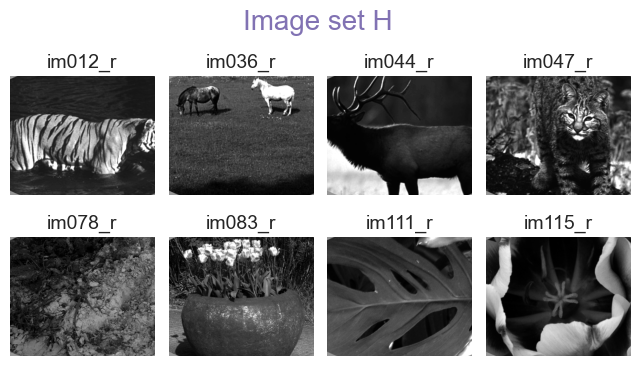

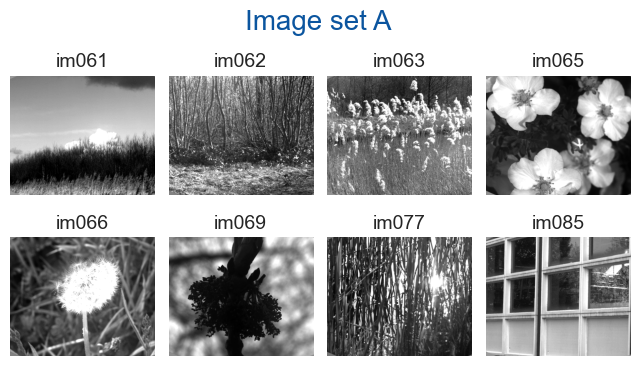

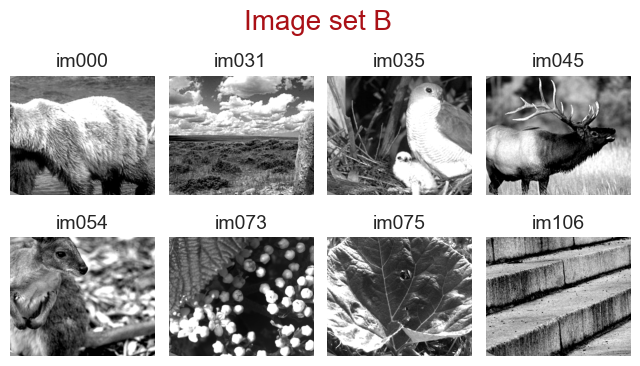

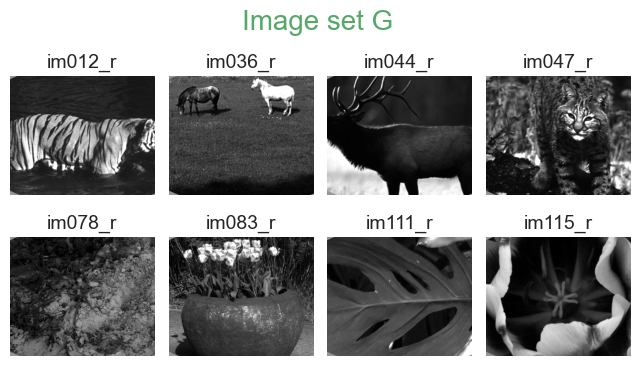

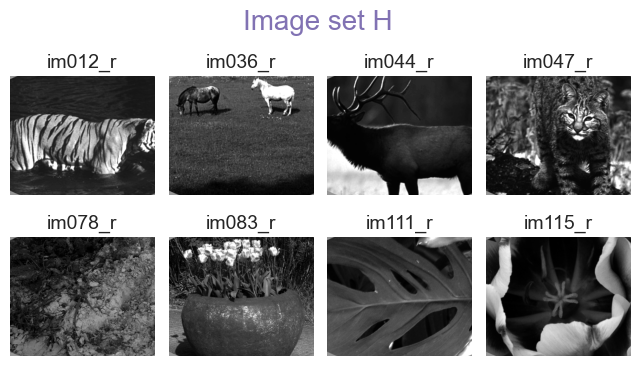

In [12]:
colors = utils.get_experience_level_colors()
c = sns.color_palette()
gh_colors = [c[2], c[4]]

# Familiar / image set A
familiar_experiment_id = platform_experiments[(platform_experiments.project_code == 'VisualBehavior') &
                                              (platform_experiments.experience_level == 'Familiar')].index.values[0]
plot_image_set(loading.get_ophys_dataset(familiar_experiment_id).stimulus_templates.copy(),
               'Image set A', colors[0])

# Novel / image set B
novel_experiment_id = platform_experiments[(platform_experiments.project_code == 'VisualBehavior') &
                                           (platform_experiments.experience_level == 'Novel')].index.values[0]
plot_image_set(loading.get_ophys_dataset(novel_experiment_id).stimulus_templates.copy(),
               'Image set B', colors[1])

# Multiscope familiar / image sets G and H
# NOTE: the original notebook loaded the SAME (Familiar multiscope) experiment for both G and H;
# preserved here. If G and H are meant to be different sets, swap the experiment selection for one of them.
ms_experiment_id = all_experiments_table[(all_experiments_table.project_code == 'VisualBehaviorMultiscope4areasx2d') &
                                         (all_experiments_table.experience_level == 'Familiar')].index.values[0]
ms_templates = loading.get_ophys_dataset(ms_experiment_id).stimulus_templates.copy()
plot_image_set(ms_templates, 'Image set G', gh_colors[0], vmin=0, vmax=255)
plot_image_set(ms_templates, 'Image set H', gh_colors[1], vmin=0, vmax=255)


### Stimulus-based behavior stats (ophys), computed once with consistent auto-reward handling

Loads `stimulus_behavior_response_df` once (full record), derives `sbr_trim` via the shared `vbu.drop_autorewarded_warmup`, and builds the ophys stimulus-based stats used by the performance / cohort / cre-line panels below. The training-history panels keep the SDK tables (`behavior_stats_sdk`) since training sessions have no stimulus_behavior_response_df.

In [13]:
# ===== Stimulus-based behavior data + ophys stats: load once, quantify once =====
stim_behavior_response_df, problem_mice = loading.get_stimulus_behavior_response_df(
    platform_experiments.mouse_id.unique(), metadata_table=platform_experiments)
print(len(stim_behavior_response_df.mouse_id.unique()), 'mice loaded; problem mice:', problem_mice)

# single source of truth for auto-reward trimming (task metrics use the trimmed df)
sbr_trim = vbu.drop_autorewarded_warmup(stim_behavior_response_df)
stim_meta = platform_experiments[['behavior_session_id', 'mouse_id', 'experience_level',
                                  'cell_type', 'project_code']].drop_duplicates('behavior_session_id')

# ophys stimulus-based session stats (validated metric definitions), one row per session
stim_stats_ophys = vbu.generate_stimulus_based_behavior_stats_table_from_presentations(
    sbr_trim, metadata_table=stim_meta)

# SDK-schema aliases so the existing panels' metric names resolve. For stimulus-based metrics the
# trial-count (Macmillan-Creelman) correction is negligible at these N, so 'uncorrected' == the rate.
stim_stats_ophys['mean_hit_rate'] = stim_stats_ophys['hit_rate']
stim_stats_ophys['mean_hit_rate_uncorrected'] = stim_stats_ophys['hit_rate']
stim_stats_ophys['mean_hit_rate_engaged'] = stim_stats_ophys['hit_rate_engaged']
stim_stats_ophys['mean_false_alarm_rate'] = stim_stats_ophys['fa_rate']
stim_stats_ophys['mean_false_alarm_rate_uncorrected'] = stim_stats_ophys['fa_rate']
stim_stats_ophys['mean_false_alarm_rate_engaged'] = stim_stats_ophys['fa_rate_engaged']
stim_stats_ophys['number_of_engaged_go_trials'] = stim_stats_ophys['n_go_opportunities_engaged']

# engaged view: the base metric names carry the engaged-only values (for the engaged panels)
stim_stats_ophys_engaged = stim_stats_ophys.copy()
for base in ['hit_rate', 'fa_rate', 'dprime_trial_corrected', 'dprime_non_trial_corrected',
             'response_latency_mean']:
    if base + '_engaged' in stim_stats_ophys_engaged.columns:
        stim_stats_ophys_engaged[base] = stim_stats_ophys_engaged[base + '_engaged']

print('stim_stats_ophys:', stim_stats_ophys.shape)


66 mice loaded; problem mice: []


/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/utilities.py:542: RuntimeWarning: invalid value encountered in subtract
  d_prime = Z(hit_rate.fillna(0)) - Z(fa_rate.fillna(0))
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/utilities.py:542: RuntimeWarning: invalid value encountered in subtract
  d_prime = Z(hit_rate.fillna(0)) - Z(fa_rate.fillna(0))
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/utilities.py:542: RuntimeWarning: invalid value encountered in subtract
  d_prime = Z(hit_rate.fillna(0)) - Z(fa_rate.fillna(0))
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/utilities.py:542: RuntimeWarning: invalid value encountered in subtract
  d_prime = Z(hit_rate.fillna(0)) - Z(fa_rate.fillna(0))
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/utilities.py:542: RuntimeWarning: invalid value encountered in subtract
  d_prime = Z(hit_rate.fillna(0)) - Z(fa_rate.fillna(0))


stim_stats_ophys: (202, 51)


/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/utilities.py:542: RuntimeWarning: invalid value encountered in subtract
  d_prime = Z(hit_rate.fillna(0)) - Z(fa_rate.fillna(0))
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/utilities.py:542: RuntimeWarning: invalid value encountered in subtract
  d_prime = Z(hit_rate.fillna(0)) - Z(fa_rate.fillna(0))


### Training history and behavior performance

In [14]:
behavior_sessions.behavior_stage.unique()

array(['gratings_static_training', 'gratings_flashed_training',
       'familiar_images_training', 'familiar_images_ophys',
       'familiar_images_ophys_passive', 'novel_images_ophys',
       'novel +_images_ophys_passive', 'novel +_images_ophys'],
      dtype=object)

In [17]:
# # Run this in your notebook after the data loading cells have executed:

# # 1. Does engaged_behavior_stats_stim have a cell_type column?
# print("cell_type in engaged_behavior_stats_stim:", 'cell_type' in engaged_behavior_stats_stim.columns)

# # 2. What columns does it have?
# print("columns:", list(engaged_behavior_stats_stim.columns))

# # 3. How many unique experience_levels in behavior_stats_sdk?
# print("experience_levels:", behavior_stats_sdk.experience_level.unique())

# # 4. How many project_codes per cohort subset?
# for pc in ['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']:
#     tmp = behavior_stats_sdk[behavior_stats_sdk.project_code == pc]
#     print(f"{pc}: {len(tmp)} rows, project_codes: {tmp.project_code.unique()}")

['Training' 'Familiar' 'Novel' 'Novel +']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [11..256].


<Axes: title={'center': 'Training history'}, xlabel='Session number', ylabel='Mouse number'>

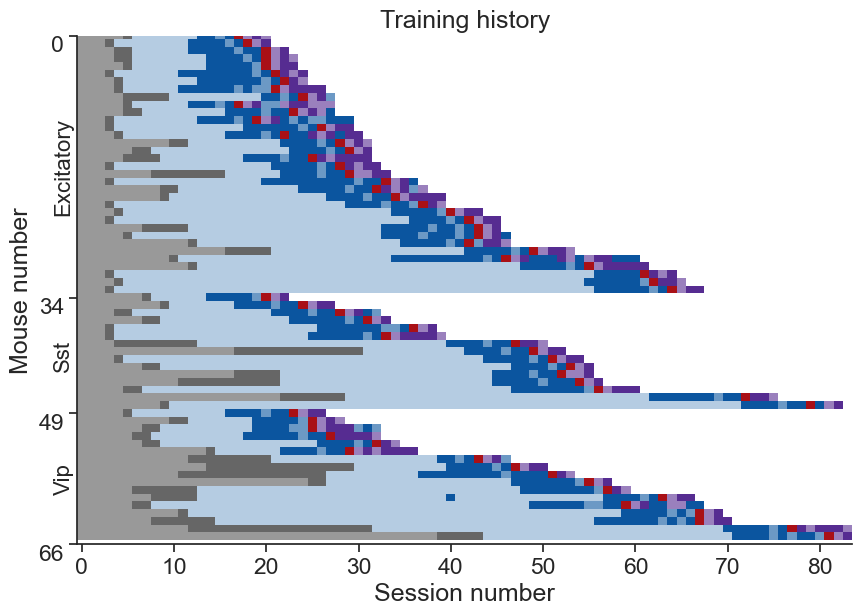

In [18]:
# Add behavior stage information
behavior_sessions_local = utilities.add_behavior_stage_to_behavior_sessions(behavior_sessions)

# Plot training history for mice grouped by cre line
color_column = 'behavior_stage'
color_map = utils.get_behavior_stage_color_map(as_rgb=True)
ppf.plot_training_history_for_mice(behavior_sessions_local, color_column=color_column,
                                   color_map=color_map, group_by_cre_line=True,
                                   save_dir=save_dir, folder='training_history', suffix='_by_cre')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [11..256].


<Axes: title={'center': 'Training history'}, xlabel='Session number', ylabel='Mouse number'>

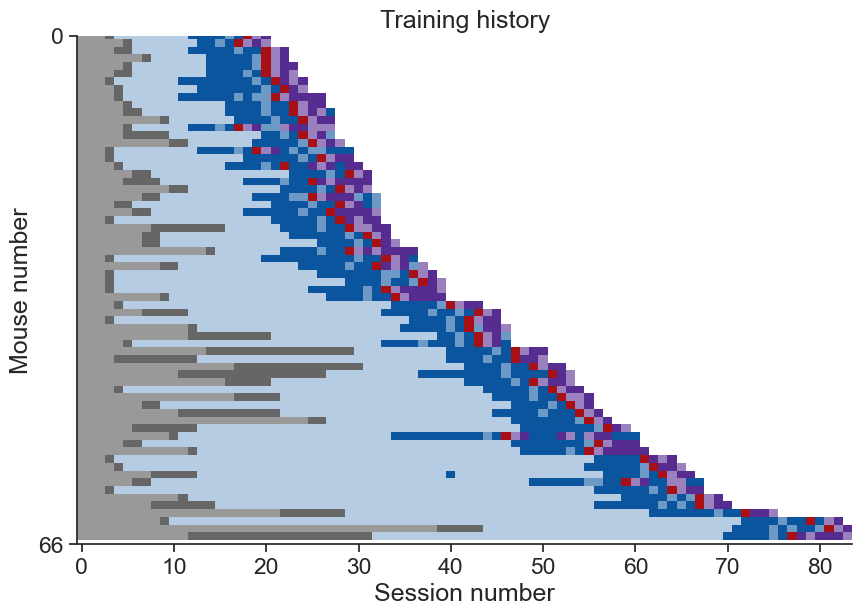

In [19]:
# Plot training history without cre line grouping
ppf.plot_training_history_for_mice(behavior_sessions_local, color_column=color_column,
                                   color_map=color_map, group_by_cre_line=False,
                                   save_dir=save_dir, folder='training_history', suffix='')

<Axes: ylabel='Days in stage'>

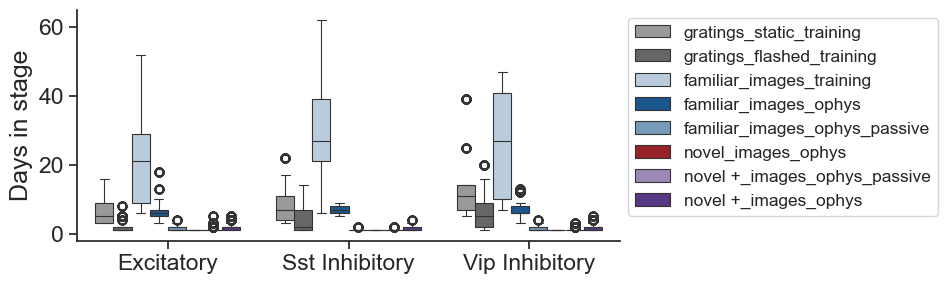

In [21]:
# Plot days in each stage
ppf.plot_days_in_stage(behavior_sessions_local, 'behavior_stage', save_dir, 'training_history',
                      suffix='_behavior_stage')

/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7494: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=exposures, x='experience_level', y='prior_exposures_to_image_set',
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7503: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(experience_levels, rotation=90)


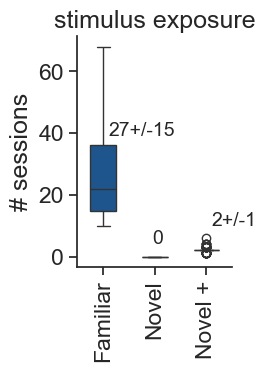

In [22]:
# Plot prior exposures to image sets before platform ophys sessions
ppf.plot_prior_exposures_to_image_set_before_platform_ophys_sessions(platform_experiments,
                                                                behavior_sessions_local,
                                                                save_dir=save_dir,
                                                                folder='training_history',
                                                                suffix='', ax=None)

/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7627: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=exposures, y='experience_level', x='prior_exposures_to_image_set', orient='h',
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7636: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_yticklabels(experience_levels, rotation=0)


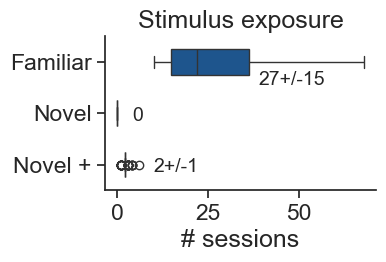

In [23]:
# Plot horizontal version
ppf.plot_prior_exposures_to_image_set_before_platform_ophys_sessions_horiz(platform_experiments,
                                                                     behavior_sessions_local,
                                                                     save_dir=save_dir,
                                                                     folder='training_history',
                                                                     suffix='_horiz', ax=None)

/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7494: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=exposures, x='experience_level', y='prior_exposures_to_image_set',
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7494: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  ax = sns.boxplot(data=exposures, x='experience_level', y='prior_exposures_to_image_set',
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7503: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(experience_levels, rota

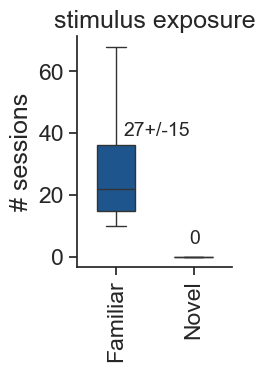

In [24]:
# Prior exposures for Familiar and Novel only
tmp_expts = platform_experiments.copy()
tmp_expts = tmp_expts[tmp_expts.experience_level.isin(['Familiar', 'Novel'])]
ppf.plot_prior_exposures_to_image_set_before_platform_ophys_sessions(tmp_expts,
                                                                behavior_sessions_local,
                                                                save_dir=save_dir,
                                                                folder='training_history',
                                                                suffix='_F_N', ax=None)

/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7565: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(data=exposures, x='cell_type', y='prior_exposures_to_image_set', order=cell_types,
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7582: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(xticklabels, rotation=90, )


saving_stats


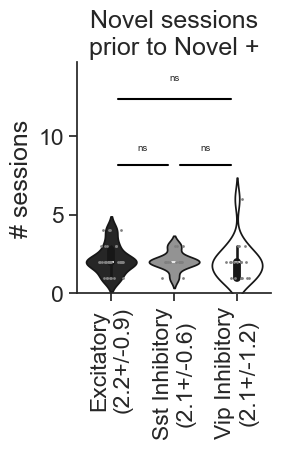

In [25]:
# Prior exposures per cell type for novel plus
ppf.plot_prior_exposures_per_cell_type_for_novel_plus(platform_experiments,
                                                      behavior_sessions_local,
                                                      save_dir=save_dir,
                                                      folder='training_history',
                                                      suffix='', ax=None)

/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7687: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=exposures, x='experience_level', y='n_sessions',
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7696: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(xticklabels, rotation=90, )


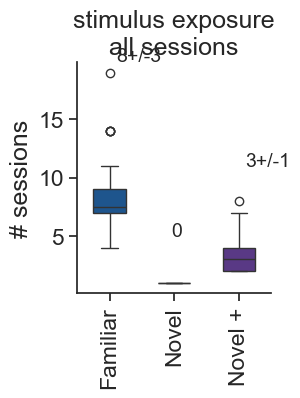

In [26]:
# Total stimulus exposures
ppf.plot_total_stimulus_exposures(behavior_sessions_local, save_dir=save_dir,
                                 folder='training_history', suffix='', ax=None)

/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7759: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=exposures, x=column_to_group, y='n_sessions',
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7776: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([col_value.replace('_', ' ') for col_value in col_values], rotation=90)
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7759: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=Fal

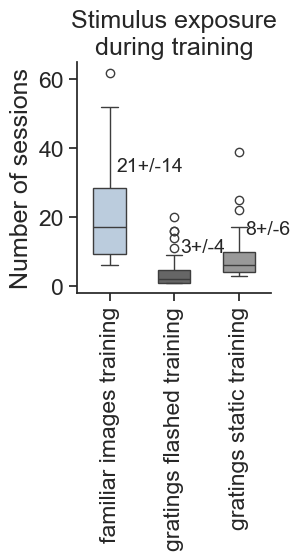

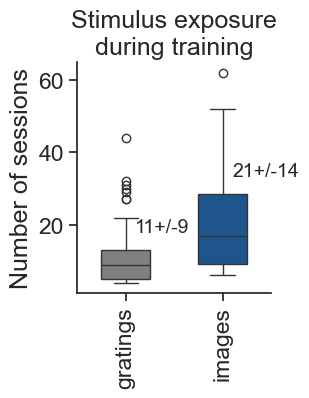

In [27]:
# Stimulus exposure prior to imaging
ppf.plot_stimulus_exposure_prior_to_imaging(behavior_sessions_local, column_to_group='behavior_stage',
                                           save_dir=save_dir, folder='training_history', suffix='', ax=None)

ppf.plot_stimulus_exposure_prior_to_imaging(behavior_sessions_local, column_to_group='stimulus_type',
                                           save_dir=save_dir, folder='training_history', suffix='_by_stimulus', ax=None)

/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:8028: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(data[hue].values, rotation=90);
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:8028: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(data[hue].values, rotation=90);


<Axes: title={'center': '512458\nExample mouse training history'}, xlabel='Session number', ylabel='d-prime'>

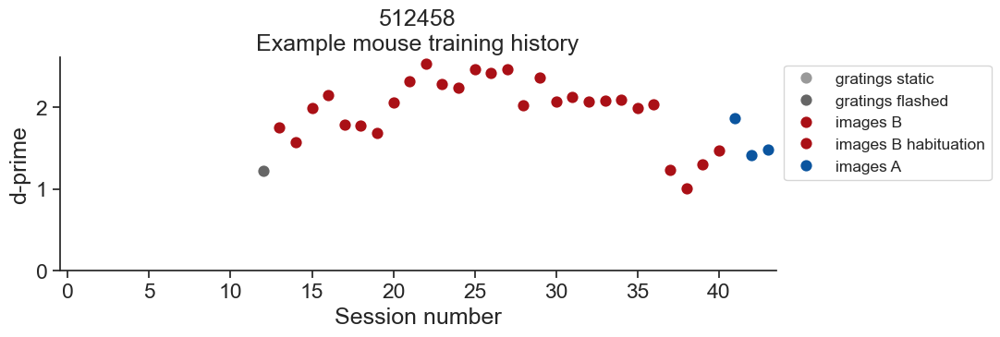

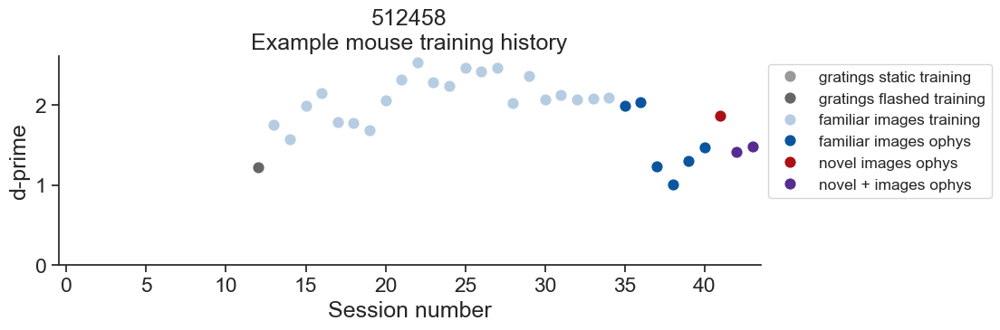

In [30]:
# Example mouse behavior performance over time
example_mouse_ids = [512458, 456917, 485688, 492395, 533161, 546605, 445002, 489066, 513626]
mouse_id = example_mouse_ids[0]
metric = 'dprime_trial_corrected'
ylabel = 'd-prime'

ppf.plot_behavior_performance_for_one_mouse(engaged_behavior_stats_stim, mouse_id, metric,
                                           method='stim_based', x='date_of_acquisition',
                                           hue='stimulus', ylabel=ylabel,
                                           save_dir=save_dir, folder='behavior_performance', ax=None)

ppf.plot_behavior_performance_for_one_mouse(engaged_behavior_stats_stim, mouse_id, metric,
                                           method='stim_based', x='date_of_acquisition',
                                           hue='behavior_stage', use_session_number=True,
                                           ylabel=ylabel, save_dir=save_dir,
                                           folder='behavior_performance', ax=None)

<Axes: ylabel='Max d-prime'>

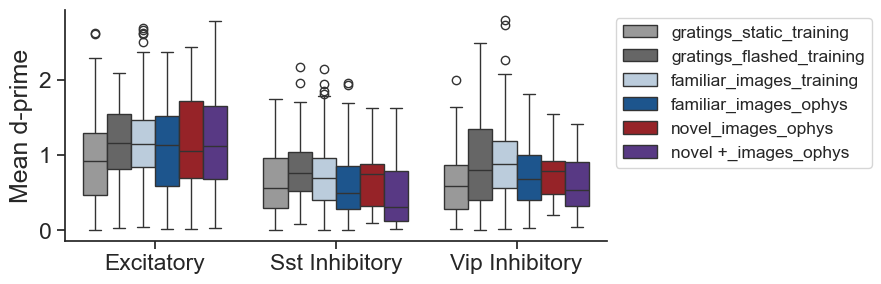

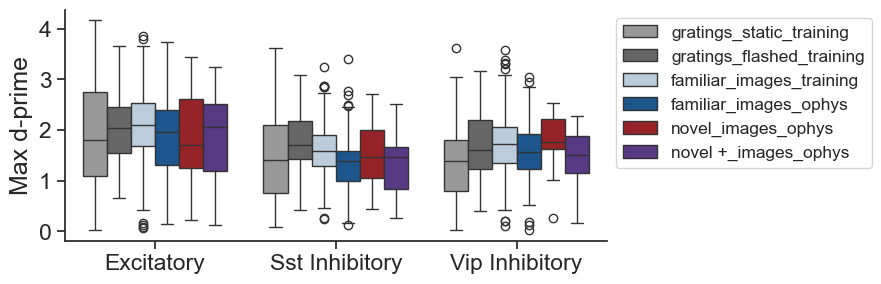

In [32]:
# Behavior metrics across training stages
data = behavior_stats_sdk.copy()
metric = 'mean_dprime'
data = data[data[metric] > 0]
ppf.plot_behavior_metric_across_stages(data, metric, ylabel='Mean d-prime',
                                      save_dir=save_dir, folder='behavior_metrics', suffix='_sdk')

data = behavior_stats_sdk.copy()
metric = 'max_dprime'
data = data[data[metric] > 0]
ppf.plot_behavior_metric_across_stages(data, metric, ylabel='Max d-prime',
                                      save_dir=save_dir, folder='behavior_metrics', suffix='_sdk_max')

<Axes: ylabel='Fraction engaged trials'>

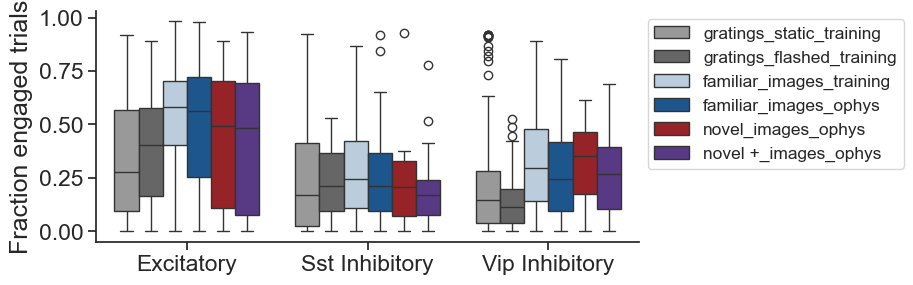

In [33]:
# Fraction trials engaged
behavior_stats_sdk['fraction_trials_engaged'] = (behavior_stats_sdk.engaged_trial_count /
                                                behavior_stats_sdk.trial_count)
data = behavior_stats_sdk.copy()
metric = 'fraction_trials_engaged'
ppf.plot_behavior_metric_across_stages(data, metric, ylabel='Fraction engaged trials',
                                      save_dir=save_dir, folder='behavior_metrics', suffix='_fraction_engaged')

<Axes: ylabel='Hit rate'>

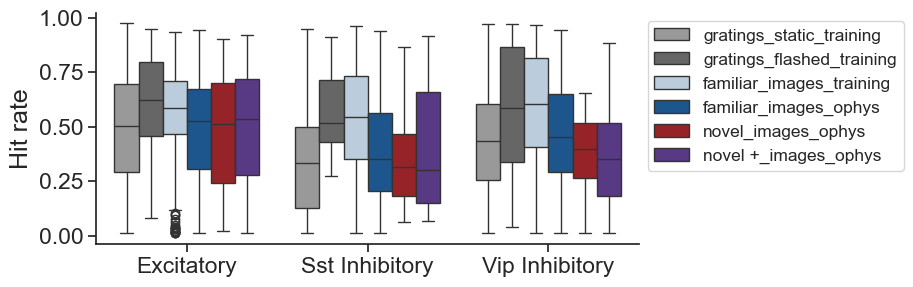

In [34]:
# Hit rate across stages
data = behavior_stats_sdk.copy()
metric = 'mean_hit_rate'
ppf.plot_behavior_metric_across_stages(data, metric, ylabel='Hit rate',
                                      save_dir=save_dir, folder='behavior_metrics', suffix='_hit_rate')

<Axes: ylabel='False alarm rate'>

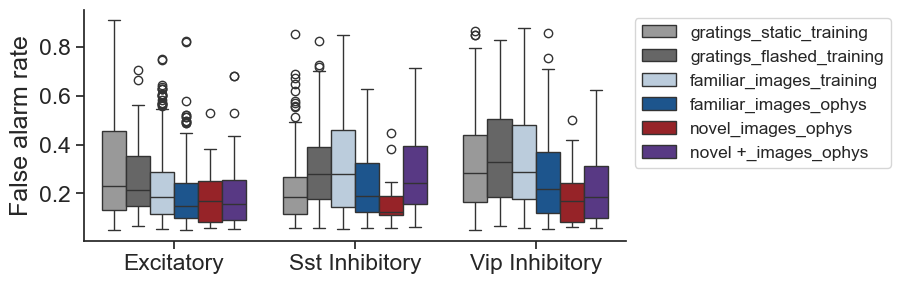

In [35]:
# False alarm rate across stages
data = behavior_stats_sdk.copy()
metric = 'mean_false_alarm_rate'
ppf.plot_behavior_metric_across_stages(data, metric, ylabel='False alarm rate',
                                      save_dir=save_dir, folder='behavior_metrics', suffix='_fa_rate')

<Axes: ylabel='Hit rate (engaged)'>

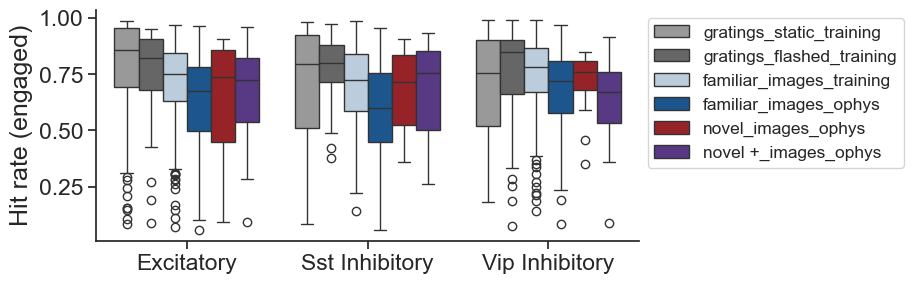

In [36]:
# Hit rate (engaged only)
data = behavior_stats_sdk.copy()
metric = 'mean_hit_rate_engaged'
ppf.plot_behavior_metric_across_stages(data, metric, ylabel='Hit rate (engaged)',
                                      save_dir=save_dir, folder='behavior_metrics', suffix='_hit_rate_engaged')

### Behavioral performance during ophys

##### SDK behavior stats

In [37]:
# def wrap_at_middle(s, max_len=25):
#     import textwrap
#     return '\n'.join(textwrap.wrap(s, width=max_len)) if len(s) > max_len else s

In [38]:
metrics = ['mean_hit_rate', 'mean_hit_rate_uncorrected', 'mean_hit_rate_engaged',
       'mean_false_alarm_rate', 'mean_false_alarm_rate_uncorrected',
       'mean_false_alarm_rate_engaged', 'mean_dprime', 'mean_dprime_engaged',
       'max_dprime', 'max_dprime_engaged',]

Text(0.52, 1.08, 'SDK behavior stats')

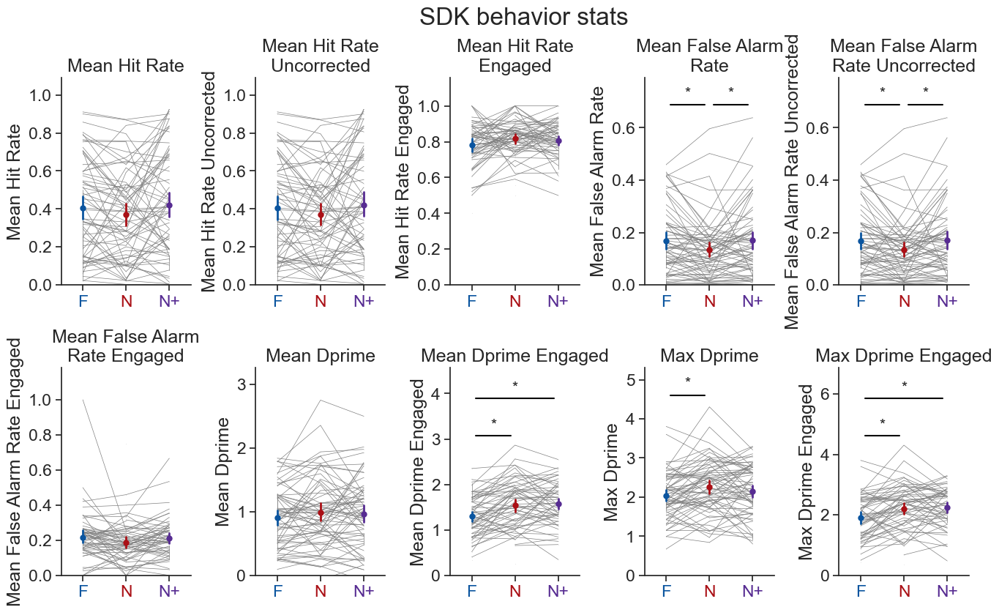

In [39]:
fig, ax = plt.subplots(2, 5, figsize=(16, 8))
for i, metric in enumerate(metrics):
    row = i // 5
    col = i % 5
    ylabel = metric.replace('_', ' ').title()
    title = utils.wrap_at_middle(ylabel, max_len=20)
    stats = stim_stats_ophys.copy()
    stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
    ax[row, col] = ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
                                      ylabel=ylabel, ylims=None, show_mice=True,
                                      best_image=False, plot_stats=True,
                                      stripplot=False, show_ns=False,
                                      save_dir=None, ax=ax[row, col])
fig.subplots_adjust(hspace=0.4, wspace=0.5)
fig.suptitle('SDK behavior stats', x=0.52, y=1.08, fontsize=24)

In [40]:
# fig, ax = plt.subplots(5, 2, figsize=(5, 18))
# for i, metric in enumerate(metrics):
#     row = i // 2
#     col = i % 2
#     ylabel = metric.replace('_', ' ').title()
#     title = utils.wrap_at_middle(ylabel, max_len=18)
#     stats = behavior_stats_sdk.copy()
#     stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
#     ax[row, col] = ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
#                                       ylabel=ylabel, ylims=None, show_mice=True,
#                                       best_image=False, plot_stats=True,
#                                       stripplot=False, show_ns=False,
#                                       save_dir=None, ax=ax[row, col])
# fig.subplots_adjust(hspace=0.5, wspace=0.7)
# fig.suptitle('SDK behavior stats', x=0.52, y=1.02, fontsize=22)

##### Engaged periods 

In [41]:
# # Behavior metrics by experience level - SDK metrics
# metric = 'mean_hit_rate_engaged'
# ylabel = 'Hit rate (engaged)'
# title = ''
# stats = behavior_stats_sdk.copy()
# stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

# suffix = '_sdk_platform_experiments'
# ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
#                                       ylabel=ylabel, ylims=[0, 0.8], show_mice=True,
#                                       best_image=False, plot_stats=True,
#                                       stripplot=False, show_ns=False,
#                                       save_dir=save_dir, folder='behavior_metrics', suffix=suffix)

##### Stimulus based behavior stats

In [42]:
metrics = ['response_latency_mean', 'response_latency_std', 
            'hit_rate', 'fa_rate','number_of_engaged_go_trials',
            'fraction_engaged', 'dprime_trial_corrected',
            'dprime_non_trial_corrected'] 

In [43]:
##### Full session

Text(0.52, 1.08, 'Stim based behavior stats')

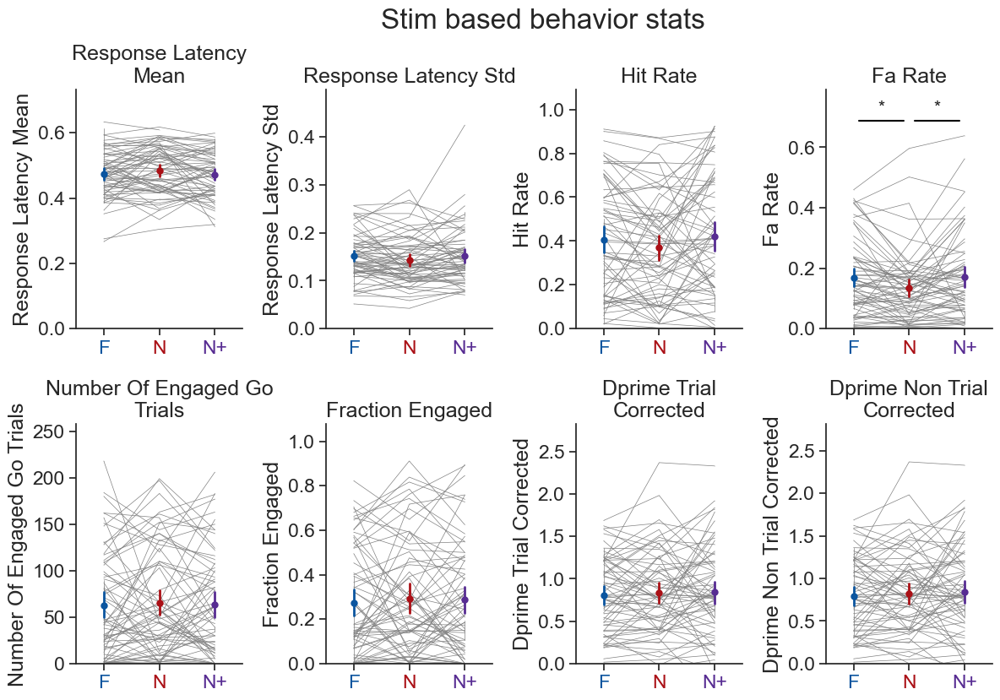

In [44]:
fig, ax = plt.subplots(2, 4, figsize=(14, 8))
for i, metric in enumerate(metrics):
    row = i // 4
    col = i % 4
    ylabel = metric.replace('_', ' ').title()
    title = utils.wrap_at_middle(ylabel, max_len=20)
    stats = stim_stats_ophys.copy()
    stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
    ax[row, col] = ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
                                      ylabel=ylabel, ylims=None, show_mice=True,
                                      best_image=False, plot_stats=True,
                                      stripplot=False, show_ns=False,
                                      save_dir=None, ax=ax[row, col])
fig.subplots_adjust(hspace=0.4, wspace=0.5)
fig.suptitle('Stim based behavior stats', x=0.52, y=1.08, fontsize=24)

In [45]:
##### Engaged periods only

Text(0.52, 1.08, 'Stim based behavior stats - engaged')

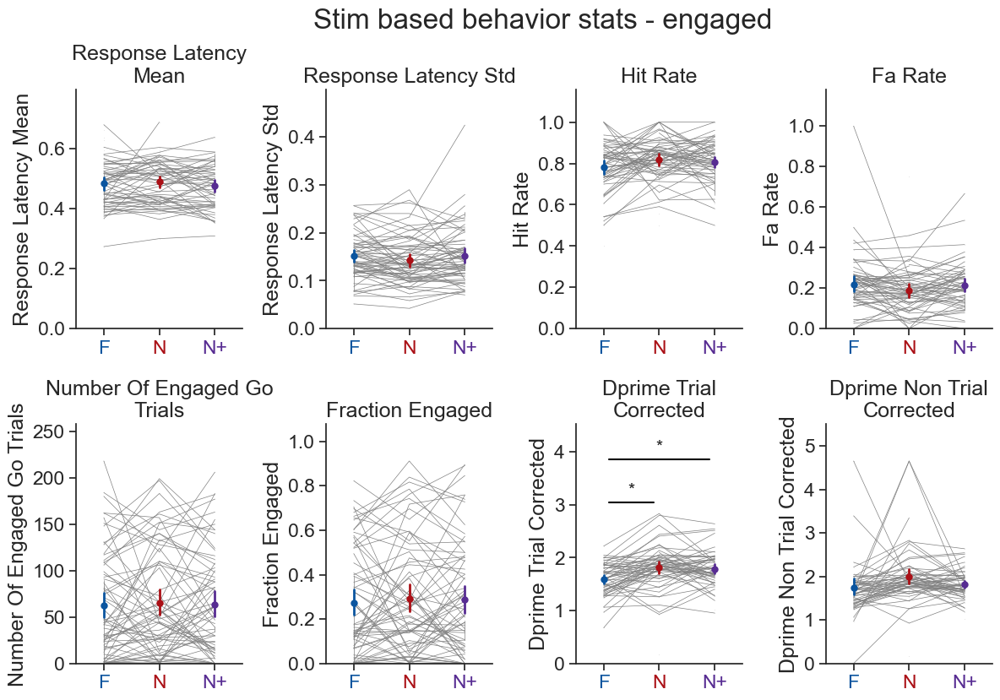

In [46]:
fig, ax = plt.subplots(2, 4, figsize=(14, 8))
for i, metric in enumerate(metrics):
    row = i // 4
    col = i % 4
    ylabel = metric.replace('_', ' ').title()
    title = utils.wrap_at_middle(ylabel, max_len=20)
    stats = stim_stats_ophys_engaged.copy()
    stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
    ax[row, col] = ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
                                      ylabel=ylabel, ylims=None, show_mice=True,
                                      best_image=False, plot_stats=True,
                                      stripplot=False, show_ns=False,
                                      save_dir=None, ax=ax[row, col])
fig.subplots_adjust(hspace=0.4, wspace=0.5)
fig.suptitle('Stim based behavior stats - engaged', x=0.52, y=1.08, fontsize=24)

In [47]:
# fig, ax = plt.subplots(4, 2, figsize=(5, 15))
# for i, metric in enumerate(metrics):
#     row = i // 2
#     col = i % 2
#     ylabel = metric.replace('_', ' ').title()
#     title = wrap_at_middle(ylabel, max_len=18)
#     stats = behavior_stats_stim.copy()
#     stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
#     ax[row, col] = ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
#                                       ylabel=ylabel, ylims=None, show_mice=True,
#                                       best_image=False, plot_stats=True,
#                                       stripplot=False, show_ns=False,
#                                       save_dir=None, ax=ax[row, col])
# fig.subplots_adjust(hspace=0.5, wspace=0.7)
# fig.suptitle('Stim based behavior stats', x=0.52, y=1.02, fontsize=22)

In [48]:
# fig, ax = plt.subplots(4, 2, figsize=(5, 15))
# for i, metric in enumerate(metrics):
#     row = i // 2
#     col = i % 2
#     ylabel = metric.replace('_', ' ').title()
#     title = wrap_at_middle(ylabel, max_len=18)
#     stats = engaged_behavior_stats_stim.copy()
#     stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
#     ax[row, col] = ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
#                                       ylabel=ylabel, ylims=None, show_mice=True,
#                                       best_image=False, plot_stats=True,
#                                       stripplot=False, show_ns=False,
#                                       save_dir=None, ax=ax[row, col])
# fig.subplots_adjust(hspace=0.5, wspace=0.7)
# fig.suptitle('Stim based behavior stats (engaged)', x=0.52, y=1.02, fontsize=22)

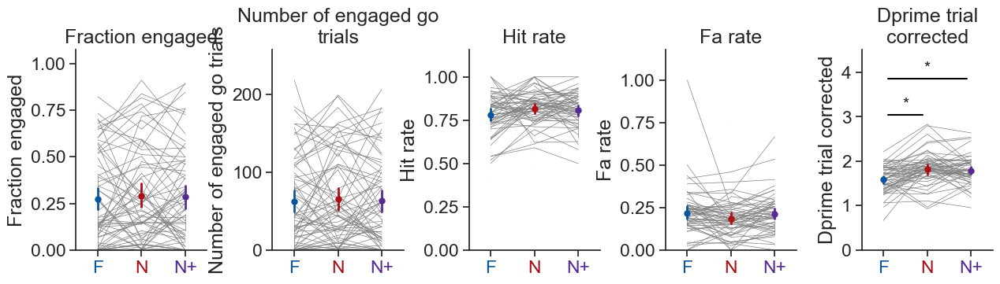

In [49]:
fig, ax = plt.subplots(1, 5, figsize=(15, 3))

stats = stim_stats_ophys.copy()
stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
metric = 'fraction_engaged'
ylabel = metric.replace('_', ' ').capitalize()
title = utils.wrap_at_middle(ylabel, max_len=20)
ax[0] = ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
                                      ylabel=ylabel, ylims=None, show_mice=True,
                                      best_image=False, plot_stats=True,
                                      stripplot=False, show_ns=False,
                                      save_dir=None, ax=ax[0])

stats = stim_stats_ophys_engaged.copy()
stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

metrics = ['number_of_engaged_go_trials',
            'hit_rate', 'fa_rate','dprime_trial_corrected'] 
for i, metric in enumerate(metrics):
    ylabel = metric.replace('_', ' ').capitalize()
    title = utils.wrap_at_middle(ylabel, max_len=20)
    stats = stim_stats_ophys_engaged.copy()
    stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
    ax[i+1] = ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
                                      ylabel=ylabel, ylims=None, show_mice=True,
                                      best_image=False, plot_stats=True,
                                      stripplot=False, show_ns=False,
                                      save_dir=None, ax=ax[i+1])
fig.subplots_adjust(hspace=0.4, wspace=0.5)
# fig.suptitle('Stim based behavior stats - engaged', x=0.52, y=1.08, fontsize=24)

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


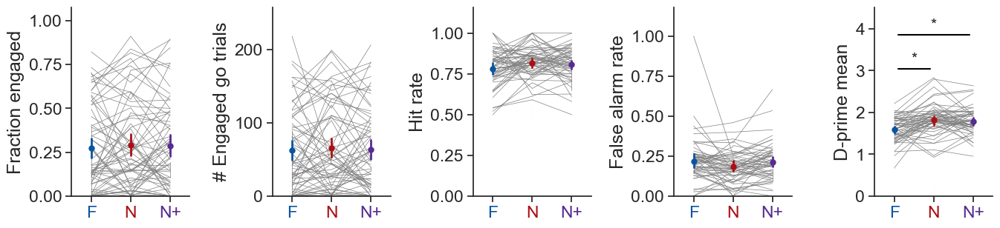

In [50]:
fig, ax = plt.subplots(1, 5, figsize=(16, 3))

stats = stim_stats_ophys.copy()
stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
metric = 'fraction_engaged'
ylabel = metric.replace('_', ' ').capitalize()
title = ''
ax[0] = ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
                                      ylabel=ylabel, ylims=None, show_mice=True,
                                      best_image=False, plot_stats=True,
                                      stripplot=False, show_ns=False,
                                      save_dir=save_dir, ax=ax[0])

stats = stim_stats_ophys_engaged.copy()
stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

metrics = ['number_of_engaged_go_trials',
            'hit_rate', 'fa_rate','dprime_trial_corrected'] 

stats = stim_stats_ophys_engaged.copy()
stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

metric = 'number_of_engaged_go_trials'
ylabel = "# Engaged go trials"
title = ''
ax[1] = ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
                                    ylabel=ylabel, ylims=None, show_mice=True,
                                    best_image=False, plot_stats=True,
                                    stripplot=False, show_ns=False,
                                    save_dir=save_dir, ax=ax[1])

metric = 'hit_rate'
ylabel = "Hit rate"
ax[2] = ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
                                    ylabel=ylabel, ylims=None, show_mice=True,
                                    best_image=False, plot_stats=True,
                                    stripplot=False, show_ns=False,
                                    save_dir=save_dir, ax=ax[2])

metric = 'fa_rate'
ylabel = "False alarm rate"
ax[3] = ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
                                    ylabel=ylabel, ylims=None, show_mice=True,
                                    best_image=False, plot_stats=True,
                                    stripplot=False, show_ns=False,
                                    save_dir=save_dir, ax=ax[3])

metric = 'dprime_trial_corrected'
ylabel = "D-prime mean"
ax[4] = ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
                                    ylabel=ylabel, ylims=None, show_mice=True,
                                    best_image=False, plot_stats=True,
                                    stripplot=False, show_ns=False,
                                    save_dir=save_dir, ax=ax[4])

fig.subplots_adjust(hspace=0.4, wspace=0.7)
# fig.suptitle('Stim based behavior stats - engaged', x=0.52, y=1.08, fontsize=24)

In [51]:
# metric = 'hit_rate'
# title = 'Hit rate'
# ylabel = title
# suffix = '_stim_based_engaged'
# stats = engaged_behavior_stats_stim.copy()
# stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

# ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
#                                         ylabel=ylabel, ylims=None, show_mice=True,
#                                         best_image=False, plot_stats=True,
#                                         stripplot=False, show_ns=False,
#                                         save_dir=save_dir, folder='behavior_metrics', suffix=suffix)

In [52]:
#### Platform behavior stats - stimulus based metrics computed per stimulus type (change, could_change, omissions, post-omission)

In [53]:
platform_behavior_stats.columns

Index(['trial_type', 'response_probability', 'behavior_session_id',
       'fraction_engaged', 'dprime_non_change', 'dprime_could_change',
       'ophys_session_id', 'ophys_container_id', 'mouse_id', 'indicator',
       'full_genotype', 'driver_line', 'cre_line', 'reporter_line', 'sex',
       'age_in_days', 'imaging_plane_group_count', 'project_code',
       'session_type', 'session_number', 'image_set', 'behavior_type',
       'experience_level', 'prior_exposures_to_session_type',
       'prior_exposures_to_image_set', 'prior_exposures_to_omissions',
       'date_of_acquisition', 'equipment_name', 'num_depths_per_area',
       'ophys_experiment_id', 'num_targeted_structures', 'passive',
       'cell_type', 'training_stage', 'first_day_of_stage',
       'last_day_of_stage', 'has_ophys', 'experiment_phase', 'stimulus',
       'first_day_of_stimulus', 'last_day_of_stimulus', 'stimulus_phase',
       'phase', 'stimulus_type', 'exp_level', 'engagement', 'behavior_stage',
       'stimulus_

In [54]:
platform_behavior_stats.trial_type.unique()

array(['change', 'non_change', 'could_change', 'omission',
       'post-omission'], dtype=object)

Text(0.52, 1.1, 'Stim based behavior stats - Change')

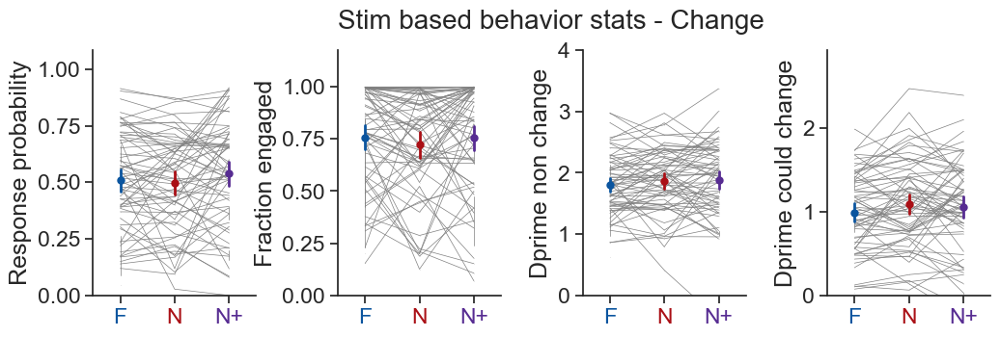

In [55]:
metrics = ['response_probability', 'fraction_engaged', 'dprime_non_change', 'dprime_could_change']

trial_type = 'change'
stats = platform_behavior_stats[platform_behavior_stats.trial_type == trial_type]
stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

fig, ax = plt.subplots(1, 4, figsize=(12, 3))
for i, metric in enumerate(metrics):
    ylabel = metric.replace('_', ' ').capitalize()
    title = ''
    ax[i] = ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
                                      ylabel=ylabel, ylims=None, show_mice=True,
                                      best_image=False, plot_stats=True,
                                      stripplot=False, show_ns=False,
                                      save_dir=None, ax=ax[i])
fig.subplots_adjust(hspace=0.4, wspace=0.5)
fig.suptitle(f'Stim based behavior stats - {trial_type.capitalize()}', x=0.52, y=1.1, fontsize=20)

In [56]:
# metric = 'fraction_engaged'
# title = 'Fraction engaged'
# ylabel = title
# suffix = '_platform_stats'
# stats = platform_behavior_stats.copy()
# stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

# ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
#                                         ylabel=ylabel, ylims=None, show_mice=True,
#                                         best_image=False, plot_stats=True,
#                                         stripplot=False, show_ns=False,
#                                         save_dir=save_dir, folder='behavior_metrics', suffix=suffix)

In [57]:
# metric = 'dprime_could_change'
# title = 'D-prime'
# ylabel = title
# suffix = '_platform_stats'
# stats = platform_behavior_stats.copy()
# stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

# ppf.plot_behavior_metric_by_experience(stats, metric, title=title,
#                                         ylabel=ylabel, ylims=None, show_mice=True,
#                                         best_image=False, plot_stats=True,
#                                         stripplot=False, show_ns=False,
#                                         save_dir=save_dir, folder='behavior_metrics', suffix=suffix)

##### Response probability

66 66


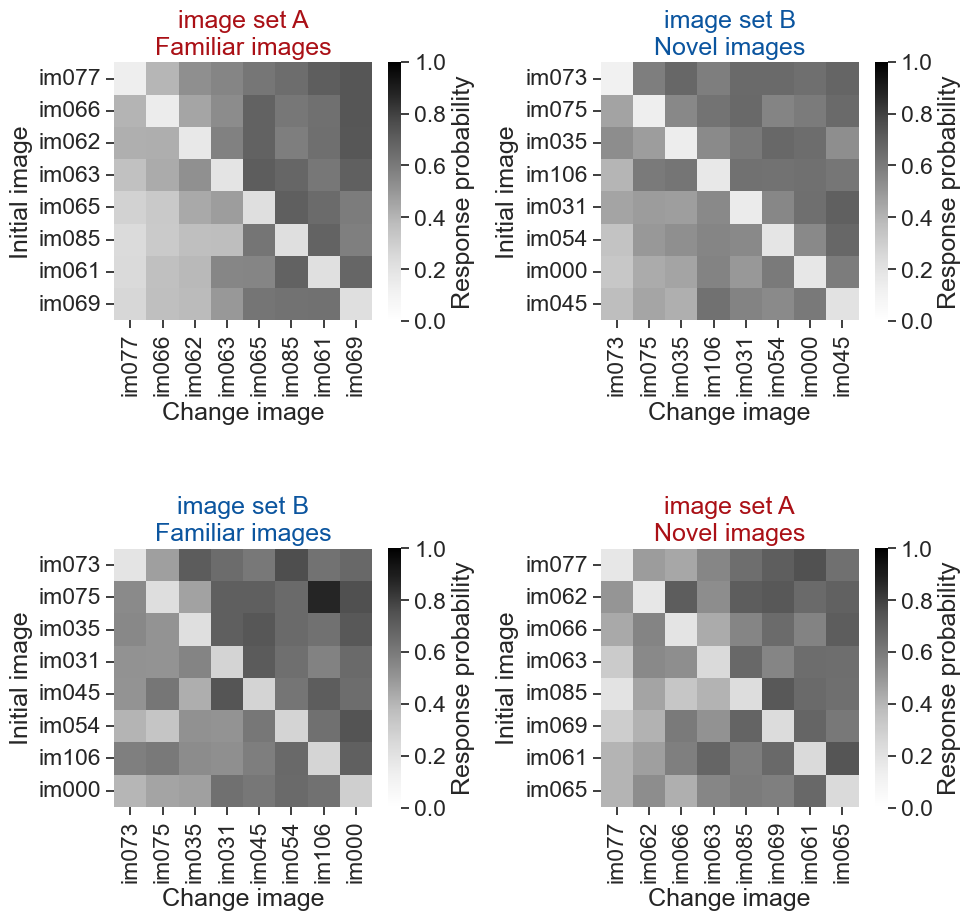

In [58]:
# limits to engaged portion of session when loading response probability values
ppf.plot_response_probability_heatmaps_for_cohorts(behavior_sessions, save_dir=save_dir)

### Cohort & cre line level behavioral performance

#### Plot behavior across cohorts & cre lines for ophys sessions

##### By cohort

In [59]:
project_codes = ['VisualBehavior', 'VisualBehaviorTask1B', 'VisualBehaviorMultiscope']


0 VisualBehavior
1 VisualBehaviorTask1B
2 VisualBehaviorMultiscope


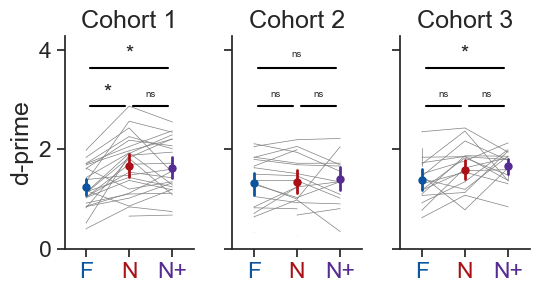

In [60]:
metric = 'mean_dprime_engaged'
ylabel = 'd-prime'
ylims = (0, 2.8)
# metrics = ['mean_dprime_engaged', 'max_dprime_engaged',
#         'mean_hit_rate_engaged', 'mean_false_alarm_rate_engaged']

stats = stim_stats_ophys.copy()
stats = stats[stats[metric]>0]
stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
stats = stats[stats.mouse_id.isin(platform_experiments.mouse_id.unique())]

# turn ophys_container_id to mouse_id so that across mouse / container plotting works
stats['ophys_container_id'] = stats['mouse_id']

suffix = '_sdk_stats_cohorts'

figsize = (6, 2.5)
fig, ax = plt.subplots(1, 3, figsize=figsize, sharey=True)
for i, project_code in enumerate(project_codes): 
    print(i, project_code)
    title = 'Cohort '+str(i+1)
    tmp = stats[stats.project_code==project_code]

    ax[i] = ppf.plot_behavior_metric_by_experience(tmp, metric, title=title, ylabel=ylabel, ylims=ylims,
                                        best_image=False, show_mice=True, plot_stats=True, stripplot=False, show_ns=True,
                                        save_dir=None, folder='behavior_metrics', suffix=suffix, ax=ax[i])
    ax[i].set_title(title)
fig.subplots_adjust(wspace=0.3)
# utils.save_figure(fig, figsize, save_dir, 'behavior_metrics', metric + suffix)

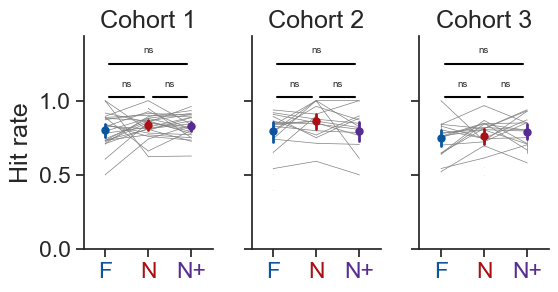

In [61]:
metric = 'mean_hit_rate_engaged'
ylabel = 'Hit rate'

stats = stim_stats_ophys.copy()
stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

# turn ophys_container_id to mouse_id so that across mouse / container plotting works
stats['ophys_container_id'] = stats['mouse_id']

suffix = '_stim_based_cohorts'

figsize = (6, 2.5)
fig, ax = plt.subplots(1, 3, figsize=figsize, sharey=True)
for i, project_code in enumerate(project_codes): 
    title = 'Cohort '+str(i+1)
    tmp = stats[stats.project_code==project_code]


    ax[i] = ppf.plot_behavior_metric_by_experience(tmp, metric, title=title, ylabel=ylabel, ylims=(0, 1),
                                        best_image=False, show_mice=True, plot_stats=True, stripplot=False, show_ns=True,
                                        save_dir=None, folder='behavior_metrics', suffix=suffix, ax=ax[i])
    ax[i].set_title(title)
fig.subplots_adjust(wspace=0.3)
utils.save_figure(fig, figsize, save_dir, folder, metric + '_cohorts')

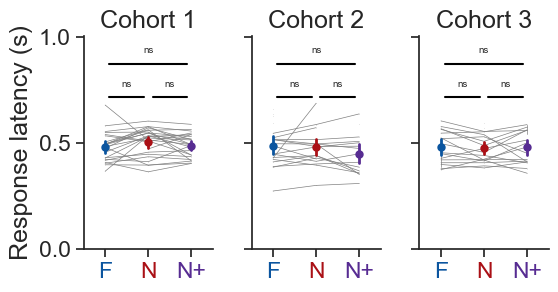

In [62]:
metric = 'response_latency_mean'

# metrics = ['response_latency_mean', 'fraction_engaged',
#         'dprime_trial_corrected', 'hit_rate']

stats = stim_stats_ophys_engaged.copy()
stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

# turn ophys_container_id to mouse_id so that across mouse / container plotting works
stats['ophys_container_id'] = stats['mouse_id']

suffix = '_stim_based_cohorts'

figsize = (6, 2.5)
fig, ax = plt.subplots(1, 3, figsize=figsize, sharey=True)
for i, project_code in enumerate(project_codes): 
    title = 'Cohort '+str(i+1)
    tmp = stats[stats.project_code==project_code]

    ax[i] = ppf.plot_behavior_metric_by_experience(tmp, metric, title=title, ylabel='Response latency (s)', ylims=(0, 0.7),
                                        best_image=False, show_mice=True, plot_stats=True, stripplot=False, show_ns=True,
                                        save_dir=None, folder='behavior_metrics', suffix=suffix, ax=ax[i])
    ax[i].set_title(title)
fig.subplots_adjust(wspace=0.3)
utils.save_figure(fig, figsize, save_dir, folder, metric + '_cohorts')

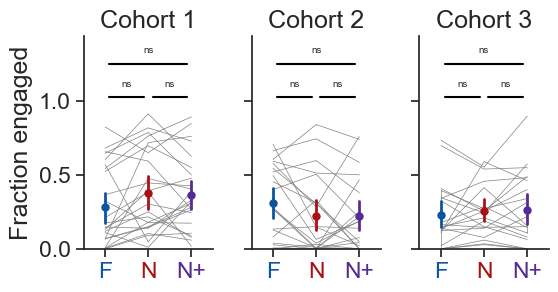

In [63]:
metric = 'fraction_engaged'

# metrics = ['response_latency_mean', 'fraction_engaged',
#         'dprime_trial_corrected', 'hit_rate']

stats = stim_stats_ophys.copy()
stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

# turn ophys_container_id to mouse_id so that across mouse / container plotting works
stats['ophys_container_id'] = stats['mouse_id']

suffix = '_stim_based_cohorts'

figsize = (6, 2.5)
fig, ax = plt.subplots(1, 3, figsize=figsize, sharey=True)
for i, project_code in enumerate(project_codes): 
    title = 'Cohort '+str(i+1)
    tmp = stats[stats.project_code==project_code]


    ax[i] = ppf.plot_behavior_metric_by_experience(tmp, metric, title=title, ylabel='Fraction engaged', ylims=(0, 1),
                                        best_image=False, show_mice=True, plot_stats=True, stripplot=False, show_ns=True,
                                        save_dir=None, folder='behavior_metrics', suffix=suffix, ax=ax[i])
    ax[i].set_title(title)
fig.subplots_adjust(wspace=0.3)
utils.save_figure(fig, figsize, save_dir, folder, metric + '_cohorts')

##### By cre line

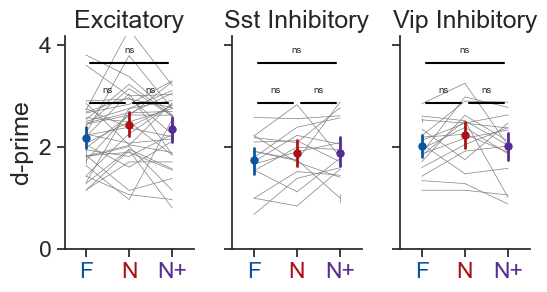

In [64]:
metric = 'max_dprime'
ylabel = 'd-prime'
ylims = (0, 2.8)
# metrics = ['mean_dprime_engaged', 'max_dprime_engaged',
#         'mean_hit_rate_engaged', 'mean_false_alarm_rate_engaged']

stats = stim_stats_ophys.copy()
stats = stats[stats[metric]>0]
stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

# turn ophys_container_id to mouse_id so that across mouse / container plotting works
stats['ophys_container_id'] = stats['mouse_id']

suffix = '_sdk_stats_by_cell_type'

figsize = (6, 2.5)
fig, ax = plt.subplots(1, 3, figsize=figsize, sharey=True)
for i, cell_type in enumerate(cell_types): 
    title = cell_type
    tmp = stats[stats.cell_type==cell_type]


    ax[i] = ppf.plot_behavior_metric_by_experience(tmp, metric, title=title, ylabel=ylabel, ylims=ylims,
                                        best_image=False, show_mice=True, plot_stats=True, stripplot=False, show_ns=True,
                                        save_dir=None, folder='behavior_metrics', suffix=suffix, ax=ax[i])
    ax[i].set_title(title)
fig.subplots_adjust(wspace=0.3)
utils.save_figure(fig, figsize, save_dir, 'behavior_metrics', metric + suffix)

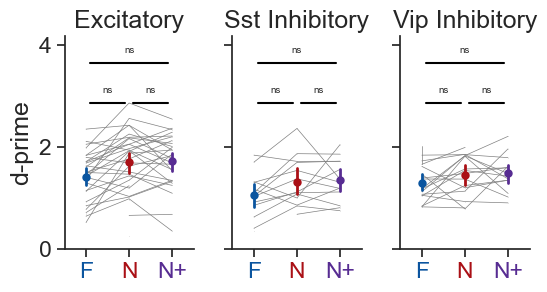

In [65]:
metric = 'mean_dprime_engaged'
ylabel = 'd-prime'
ylims = (0, 2.8)
# metrics = ['mean_dprime_engaged', 'max_dprime_engaged',
#         'mean_hit_rate_engaged', 'mean_false_alarm_rate_engaged']

stats = stim_stats_ophys.copy()
stats = stats[stats[metric]>0]
stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

# turn ophys_container_id to mouse_id so that across mouse / container plotting works
stats['ophys_container_id'] = stats['mouse_id']

suffix = '_sdk_stats_by_cell_type'

figsize = (6, 2.5)
fig, ax = plt.subplots(1, 3, figsize=figsize, sharey=True)
for i, cell_type in enumerate(cell_types): 
    title = cell_type
    tmp = stats[stats.cell_type==cell_type]


    ax[i] = ppf.plot_behavior_metric_by_experience(tmp, metric, title=title, ylabel=ylabel, ylims=ylims,
                                        best_image=False, show_mice=True, plot_stats=True, stripplot=False, show_ns=True,
                                        save_dir=None, folder='behavior_metrics', suffix=suffix, ax=ax[i])
    ax[i].set_title(title)
fig.subplots_adjust(wspace=0.3)
utils.save_figure(fig, figsize, save_dir, 'behavior_metrics', metric + suffix)

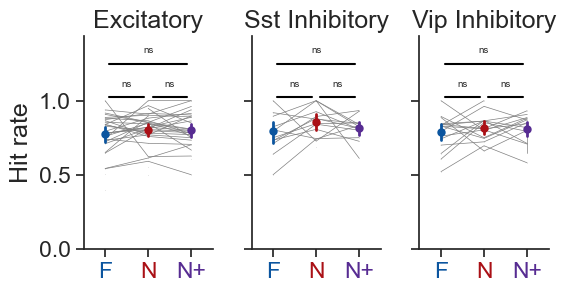

In [66]:
metric = 'mean_hit_rate_engaged'
ylabel = 'Hit rate'
ylims = (0, 1)

stats = stim_stats_ophys.copy()
stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

# turn ophys_container_id to mouse_id so that across mouse / container plotting works
stats['ophys_container_id'] = stats['mouse_id']

suffix = '_stim_based_by_cell_type'

figsize = (6, 2.5)
fig, ax = plt.subplots(1, 3, figsize=figsize, sharey=True)
for i, cell_type in enumerate(cell_types): 
    title = cell_type
    tmp = stats[stats.cell_type==cell_type]

    ax[i] = ppf.plot_behavior_metric_by_experience(tmp, metric, title=title, ylabel=ylabel, ylims=ylims,
                                        best_image=False, show_mice=True, plot_stats=True, stripplot=False, show_ns=True,
                                        save_dir=None, folder='behavior_metrics', suffix=suffix, ax=ax[i])
    ax[i].set_title(title)
fig.subplots_adjust(wspace=0.3)
utils.save_figure(fig, figsize, save_dir, 'behavior_metrics', metric + suffix)

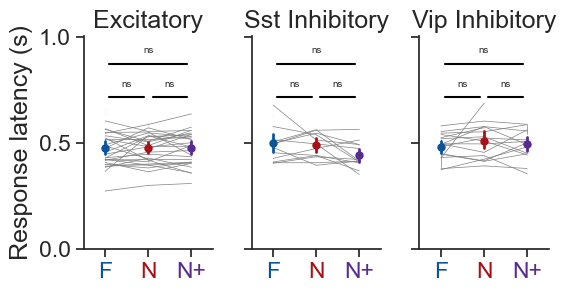

In [67]:
metric = 'response_latency_mean'
ylabel = 'Response latency (s)'

stats = stim_stats_ophys_engaged.copy()
stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

# turn ophys_container_id to mouse_id so that across mouse / container plotting works
stats['ophys_container_id'] = stats['mouse_id']

suffix = '_stim_based_by_cell_type'

figsize = (6, 2.5)
fig, ax = plt.subplots(1, 3, figsize=figsize, sharey=True)
for i, cell_type in enumerate(cell_types): 
    title = cell_type
    tmp = stats[stats.cell_type==cell_type]

    ax[i] = ppf.plot_behavior_metric_by_experience(tmp, metric, title=title, ylabel=ylabel, ylims=(0, 0.7),
                                        best_image=False, show_mice=True, plot_stats=True, stripplot=False, show_ns=True,
                                        save_dir=None, folder='behavior_metrics', suffix=suffix, ax=ax[i])
    ax[i].set_title(title)
fig.subplots_adjust(wspace=0.3)
utils.save_figure(fig, figsize, save_dir, 'behavior_metrics', metric + suffix)

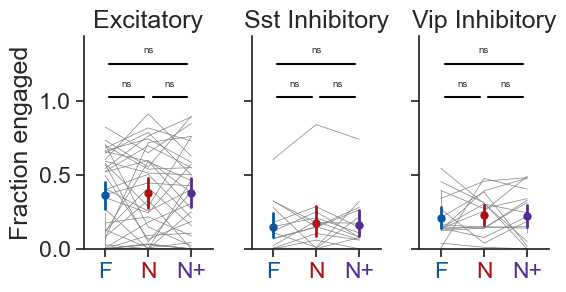

In [68]:
metric = 'fraction_engaged'
ylabel = 'Fraction engaged'
ylims = (0, 1)

stats = stim_stats_ophys.copy()
stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]

# turn ophys_container_id to mouse_id so that across mouse / container plotting works
stats['ophys_container_id'] = stats['mouse_id']

suffix = '_stim_based_by_cell_type'

figsize = (6, 2.5)
fig, ax = plt.subplots(1, 3, figsize=figsize, sharey=True)
for i, cell_type in enumerate(cell_types): 
    title = cell_type
    tmp = stats[stats.cell_type==cell_type]

    ax[i] = ppf.plot_behavior_metric_by_experience(tmp, metric, title=title, ylabel=ylabel, ylims=ylims,
                                        best_image=False, show_mice=True, plot_stats=True, stripplot=False, show_ns=True,
                                        save_dir=None, folder='behavior_metrics', suffix=suffix, ax=ax[i])
    ax[i].set_title(title)
fig.subplots_adjust(wspace=0.3)
utils.save_figure(fig, figsize, save_dir, 'behavior_metrics', metric + suffix)

### Ophys session sequence

In [69]:
# Ophys history for mice (all mice in full dataset)
behavior_sessions_all = all_behavior_sessions.copy()
behavior_sessions_all['ophys_container_id'] = behavior_sessions_all.mouse_id.values
behavior_sessions_all = utilities.add_date_string(behavior_sessions_all)
behavior_sessions_all = utilities.add_n_relative_to_first_novel_column(behavior_sessions_all)
behavior_sessions_all = utilities.add_first_novel_column(behavior_sessions_all)
behavior_sessions_all = utilities.add_passive_flag_to_ophys_experiment_table(behavior_sessions_all)
behavior_sessions_all = utilities.add_has_ophys_column_to_behavior_sessions(behavior_sessions_all)
behavior_sessions_all = utilities.add_ophys_stage_to_behavior_sessions(all_experiments_table, behavior_sessions_all)

1936
['Training' 'Familiar' 'Novel' 'Novel +']


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [11..256].


<Axes: title={'center': 'Ophys session sequence'}, xlabel='Ophys session number', ylabel='Mouse number'>

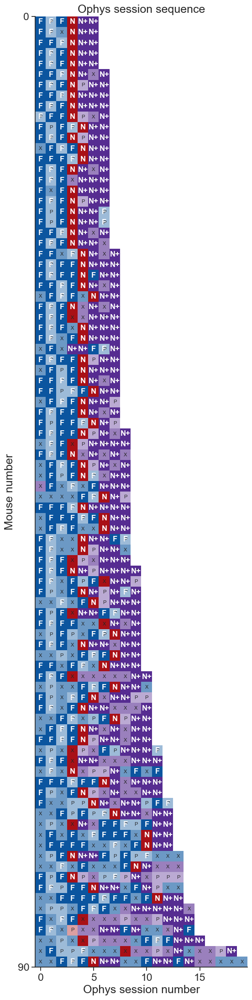

In [70]:
# Exclude 4x2 sessions
behavior_sessions_all = behavior_sessions_all[behavior_sessions_all.project_code != 'VisualBehaviorMultiscope4areasx2d']

color_column = 'ophys_stage'
color_map = utils.get_ophys_stage_color_map(as_rgb=True)

sessions = behavior_sessions_all.copy()
sessions = sessions[sessions.ophys_stage != 'None']

ppf.plot_ophys_history_for_mice(sessions, color_column=color_column, color_map=color_map,
                               save_dir=save_dir, label_with_mouse_id=False, suffix='_all_mice')

402


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [11..256].


<Axes: title={'center': 'Ophys session sequence'}, xlabel='Ophys session number', ylabel='Mouse number'>

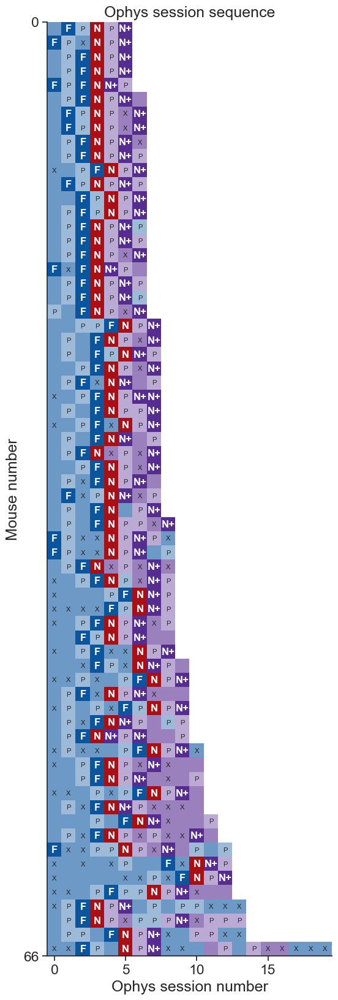

In [71]:
# For platform dataset mice only
behavior_sessions_platform = utilities.add_ophys_stage_to_behavior_sessions(platform_experiments, behavior_sessions)

sessions = behavior_sessions_platform.copy()
sessions = sessions[sessions.ophys_stage != 'None']
sessions = sessions[sessions.mouse_id.isin(platform_experiments.mouse_id.unique())]

ppf.plot_ophys_history_for_mice(sessions, color_column=color_column, color_map=color_map,
                               save_dir=save_dir, label_with_mouse_id=False, suffix='_platform_mice')

402


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [11..256].


<Axes: title={'center': 'Ophys session sequence'}, xlabel='Ophys session number', ylabel='Mouse number'>

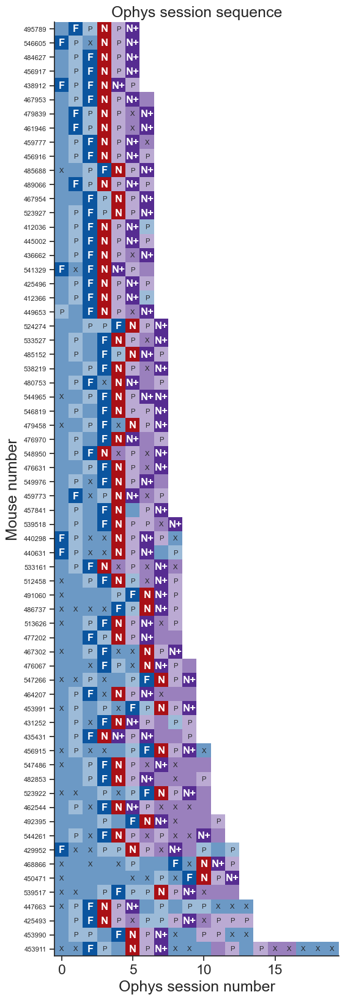

In [72]:
behavior_sessions = utilities.add_ophys_stage_to_behavior_sessions(platform_experiments, behavior_sessions)

color_column = 'ophys_stage'
color_map = utils.get_ophys_stage_color_map(as_rgb=True)
# color_map = utils.get_behavior_stage_color_map(as_rgb=True)

sessions = behavior_sessions.copy()
# exclude non-ophys & habituation sessions, which have ophys_stage = None
sessions = sessions[sessions.ophys_stage!='None']
# exclude mice that are not in platform paper dataset 
sessions = sessions[sessions.mouse_id.isin(platform_experiments.mouse_id.unique())]

ppf.plot_ophys_history_for_mice(sessions, color_column=color_column, color_map=color_map, save_dir=save_dir, 
                                label_with_mouse_id=True, suffix='_all_mice')

### Within session changes in behavior

#### Task performance 

##### Rolling d-prime using false alarm rate across stimulus presentations

In [73]:
import visual_behavior.utilities as utilities

In [74]:
# stim_behavior_response_df is loaded once in the stimulus-based prep cell near the top of the notebook


In [75]:
stim_behavior_response_df.head()

,stimulus_presentations_id,start_time,is_change,could_change,is_sham_change,auto_rewarded,omitted,post_omitted,image_name,is_image_novel,...,response_latency,lick_latency,licked,reward_rate,engaged,engagement_state,behavior_session_id,mouse_id,experience_level,cell_type
0,1,307.176084,False,False,False,False,False,False,im065,False,...,0.595966,0.595966,True,1.221875,False,disengaged,794968300,412036,Familiar,Vip Inhibitory
1,2,307.926674,False,False,False,False,False,False,im065,False,...,0.012176,0.012176,True,1.225356,False,disengaged,794968300,412036,Familiar,Vip Inhibitory
2,3,308.677274,False,False,False,False,False,False,im065,False,...,NaN,NaN,False,1.228846,False,disengaged,794968300,412036,Familiar,Vip Inhibitory
3,4,309.427924,False,False,False,False,False,False,im065,False,...,NaN,NaN,False,1.235358,False,disengaged,794968300,412036,Familiar,Vip Inhibitory
4,5,310.178494,False,False,False,False,False,False,im065,False,...,NaN,NaN,False,1.244789,False,disengaged,794968300,412036,Familiar,Vip Inhibitory


In [76]:
rolling_sdf = utilities.get_stimulus_based_rolling_performance_df_for_dataset(stim_behavior_response_df,
                                                          session_key='behavior_session_id')

# Merge with metadata 
rolling_sdf = rolling_sdf.join(platform_experiments[['behavior_session_id', 'experience_level', 'cell_type']].set_index('behavior_session_id'), on='behavior_session_id', how='left', rsuffix='_exp')

In [77]:
rolling_sdf.head()

,stimulus_presentations_id,start_time,time_in_session,is_change,licked,hit_rate_raw,hit_rate,false_alarm_rate_raw,false_alarm_rate,rolling_dprime,n_go_opportunities,n_catch_opportunities,reward_rate,mean_running_speed,mean_pupil_width,engaged,engagement_state,behavior_session_id,experience_level,cell_type
43202,5,310.416407,0.00000,False,0.0,NaN,NaN,0.0,0.500000,NaN,0.0,1.0,1.801668,24.291735,1.013573,False,disengaged,794071128,Familiar,Excitatory
43203,6,311.166937,0.75053,False,0.0,NaN,NaN,0.0,0.250000,NaN,0.0,2.0,1.798712,24.993596,1.013505,False,disengaged,794071128,Familiar,Excitatory
43204,7,311.917547,1.50114,True,0.0,0.0,0.50,0.0,0.250000,0.674490,1.0,2.0,1.795954,24.874577,1.013545,False,disengaged,794071128,Familiar,Excitatory
43218,21,322.426137,12.00973,True,0.0,0.0,0.25,0.0,0.250000,0.000000,2.0,2.0,1.774684,23.548979,1.023853,False,disengaged,794071128,Familiar,Excitatory
43228,31,329.932267,19.51586,False,0.0,0.0,0.25,0.0,0.166667,0.292932,2.0,3.0,1.774927,24.124691,1.031931,False,disengaged,794071128,Familiar,Excitatory


In [78]:
rolling_sdf.columns

Index(['stimulus_presentations_id', 'start_time', 'time_in_session',
       'is_change', 'licked', 'hit_rate_raw', 'hit_rate',
       'false_alarm_rate_raw', 'false_alarm_rate', 'rolling_dprime',
       'n_go_opportunities', 'n_catch_opportunities', 'reward_rate',
       'mean_running_speed', 'mean_pupil_width', 'engaged', 'engagement_state',
       'behavior_session_id', 'experience_level', 'cell_type'],
      dtype='object')

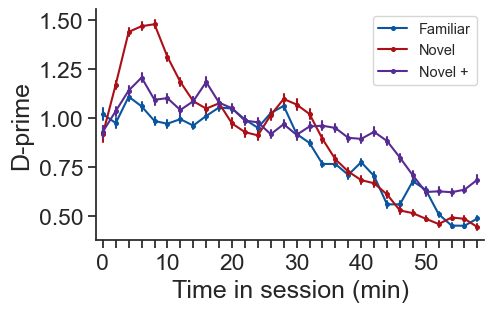

In [79]:
# rolling d-prime over time in session, in 2 min bins, x labeled in 10 min increments
ax = ppf.plot_rolling_metric_over_time_in_session(
    rolling_sdf, metric='rolling_dprime',
    bin_size_seconds=120, max_minutes=60, label_every=5,
    ylabel="D-prime", save_dir=save_dir, folder='within_session_behavior',
)

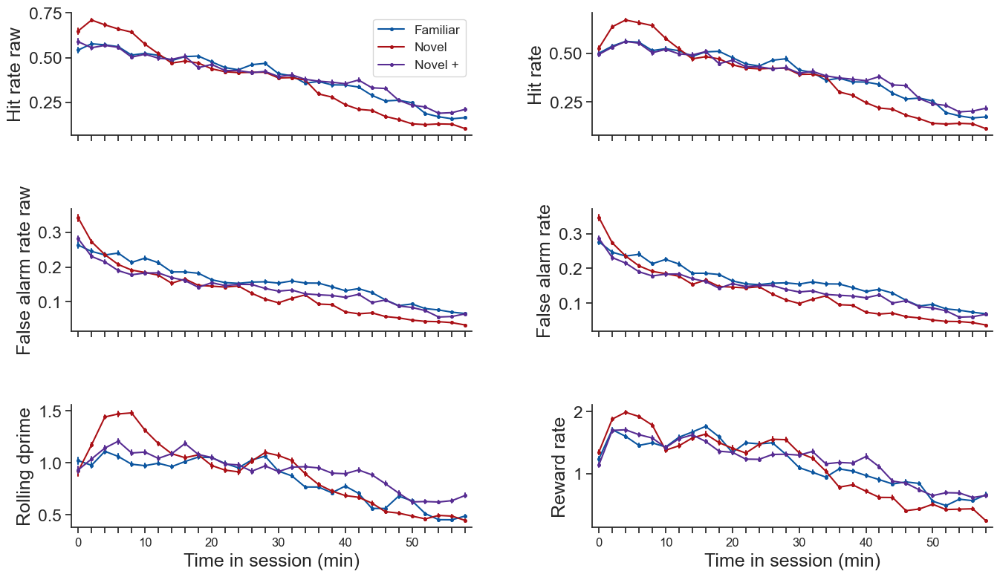

In [80]:
fig, ax = plt.subplots(3, 2, figsize=(16, 9), sharex=True)
ax = ax.ravel()
for i, metric in enumerate(['hit_rate_raw', 'hit_rate',
                'false_alarm_rate_raw', 'false_alarm_rate', 
                'rolling_dprime', 'reward_rate',]):

    ax[i] = ppf.plot_rolling_metric_over_time_in_session(
    rolling_sdf, metric=metric,
    bin_size_seconds=120, max_minutes=60, label_every=5,
    ylabel=metric.replace('_', ' ').capitalize(), ax=ax[i]
)
    ax[i].get_legend().remove()
ax[0].legend(fontsize='x-small', title_fontsize='x-small')
ax[i].set_xticklabels(ax[i].get_xticklabels(), fontsize=12, rotation=0)
ax[i-1].set_xticklabels(ax[i-1].get_xticklabels(), fontsize=12, rotation=0)

fig.subplots_adjust(hspace=0.6, wspace=0.3)

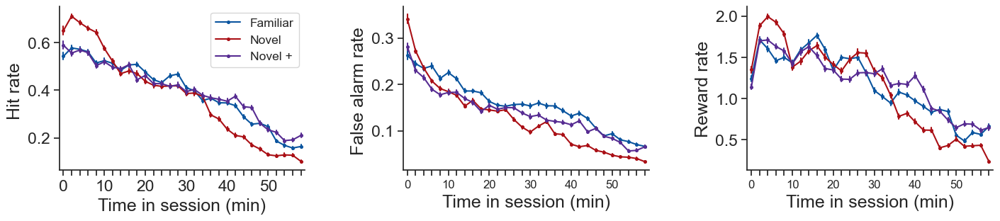

In [81]:
fig, ax = plt.subplots(1, 3, figsize=(17, 3), sharex=True)
ax = ax.ravel()
for i, metric in enumerate(['hit_rate_raw',  'false_alarm_rate_raw',  'reward_rate',]):
    ylabel = metric.replace('_', ' ').capitalize()
    if 'raw' in metric:
        # remove 'raw' from ylabel but keep capitalization and spacing
        ylabel = ylabel.replace('raw', '')
    ax[i] = ppf.plot_rolling_metric_over_time_in_session(
    rolling_sdf, metric=metric,
    bin_size_seconds=120, max_minutes=60, label_every=5,
    ylabel=ylabel, ax=ax[i]
)
    ax[i].get_legend().remove()
ax[0].legend(fontsize='x-small', title_fontsize='x-small')
ax[i].set_xticklabels(ax[i].get_xticklabels(), fontsize=12, rotation=0)
ax[i-1].set_xticklabels(ax[i-1].get_xticklabels(), fontsize=12, rotation=0)

fig.subplots_adjust(wspace=0.4)

In [82]:
# for metric in ['hit_rate_raw', 'hit_rate',
#                 'false_alarm_rate_raw', 'false_alarm_rate', 
#                 'rolling_dprime', 'reward_rate',]:
#     ax = ppf.plot_rolling_metric_over_time_in_session(
#     rolling_sdf, metric=metric,
#     bin_size_seconds=120, max_minutes=60, label_every=5,
#     ylabel=metric.replace('_', ' ').capitalize(), 
#     save_dir=save_dir, folder='within_session_behavior',
# )

##### Rolling dprime across 5 min bins across session using SDK rolling performance df

Definitions of the metrics in get_rolling_performance_df (from the docstring in behavior_session.py:718-754):

- `reward_rate` — rewards earned in the prior 25 trials divided by the elapsed time over those 25 trials, in rewards/minute. Used downstream as a proxy for engagement (low reward rate → disengaged); the default engagement threshold in get_performance_metrics is 2 rewards/min.
- `hit_rate_raw` — fraction of go trials with a lick in the response window, computed over the previous 100 non-aborted trials. Uncorrected: just #hits / #go-trials in window.
- `hit_rate` — same as above, but with the trial-count correction applied (see note below).
- `false_alarm_rate_raw` — fraction of catch trials with a lick in the response window, over the prior 100 non-aborted trials. Uncorrected.
- `false_alarm_rate` — same, with trial-count correction.
- `rolling_dprime` — d' = Z(hit_rate) − Z(false_alarm_rate), computed from the trial-count-corrected rates. Undefined until there's been at least one go and one catch trial.

On the trial-count correction: standard d′ blows up to ±∞ when the hit rate or false-alarm rate is exactly 0 or 1, which happens easily with small windows. AllenSDK uses Macmillan & Creelman's correction that bounds the probability:
1/(2N) ≤ P ≤ 1 − 1/(2N)
where N is the number of trials. So with one go trial, a "hit" becomes 0.5 instead of 1; with two go trials, it can be 0.25 / 0.5 / 0.75; etc. The corrected rates are what feed rolling_dprime.

More info: 
- AllenSDK/allensdk/brain_observatory/behavior/behavior_session.py — get_rolling_performance_df docstring (lines 718–754)
- AllenSDK/allensdk/brain_observatory/behavior/dprime_readme.md — full conceptual writeup of the d′ correction

In [83]:
# mouse_id = platform_experiments.mouse_id.unique()[0]
file_dir = os.path.join(loading.get_analysis_files_dir(), 'rolling_performance_dfs')
rolling_performance_df = pd.DataFrame()
for mouse_id in platform_experiments.mouse_id.unique(): 
    filename = str(mouse_id)+'_rolling_performance_df.csv'
    filepath = os.path.join(file_dir, filename)
    # print(filepath)
    try: 
        df = pd.read_csv(filepath)
        df['mouse_id'] = mouse_id
        rolling_performance_df = pd.concat((rolling_performance_df, df))
    except:
        print('no file for mouse_id:', mouse_id)
print(len(rolling_performance_df.mouse_id.unique()))
rolling_performance_df = rolling_performance_df.join(platform_experiments[['experience_level']], on='ophys_experiment_id')
rolling_performance_df.tail()

66


,trials_id,reward_rate,hit_rate_raw,hit_rate,false_alarm_rate_raw,false_alarm_rate,rolling_dprime,auto_rewarded,is_change,change_time,response_latency,ophys_experiment_id,ophys_session_id,mouse_id,experience_level
1525,475,0.0,0.0,0.005814,0.0,0.035714,-0.523605,False,True,3869.099508,inf,1087825602,1087664594,547486,Novel +
1526,476,0.0,0.0,0.005814,0.0,0.035714,-0.523605,False,True,3879.608098,inf,1087825602,1087664594,547486,Novel +
1527,477,0.0,0.0,0.005814,0.0,0.035714,-0.523605,False,True,3887.864848,inf,1087825602,1087664594,547486,Novel +
1528,478,0.0,0.0,0.005814,0.0,0.035714,-0.523605,False,True,3896.121588,inf,1087825602,1087664594,547486,Novel +
1529,479,0.0,0.0,0.005814,0.0,0.035714,-0.523605,False,True,3905.128948,inf,1087825602,1087664594,547486,Novel +


/var/folders/1t/06qd1ncj5q90vctbvq586lmh0000gp/T/ipykernel_2677/3024290881.py:29: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i].set_xticklabels(ax[i].get_xticklabels(), fontsize=12, rotation=0)
/var/folders/1t/06qd1ncj5q90vctbvq586lmh0000gp/T/ipykernel_2677/3024290881.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax[i-1].set_xticklabels(ax[i-1].get_xticklabels(), fontsize=12, rotation=0)


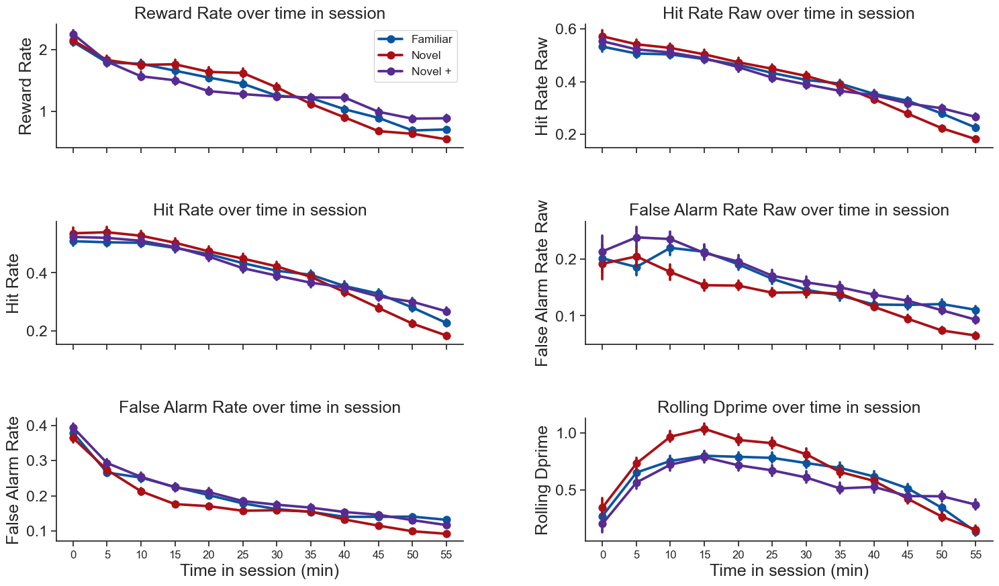

In [84]:
fig, ax = plt.subplots(3, 2, figsize=(18, 10), sharex=True)
ax = ax.ravel()
for i, metric in enumerate(['reward_rate', 'hit_rate_raw', 'hit_rate',
               'false_alarm_rate_raw', 'false_alarm_rate', 'rolling_dprime']):

    data = rolling_performance_df.reset_index(drop=True)
    # data = data[(data.trials_id>10) & (data.auto_rewarded==False)]
    data['change_time'] = (data['change_time'] - data.groupby('ophys_experiment_id')['change_time'].transform('min'))
    data = data[data.change_time < 3600]   # adjust window as needed

    # 30-second bins: 0-29, 30-59, ...
    bin_size = 60 * 5 # in seconds
    data['time_bin'] = ((data['change_time'] // bin_size) * bin_size) / 60
    data['time_bin'] = [int(x) for x in data['time_bin']]
    # data['time_bin'] = ((data['change_time'] // bin_size) * bin_size).astype(int)
    experience_level_colors = utils.get_experience_level_colors()
    ax[i] = sns.pointplot(data=data, x='time_bin', y=metric,
                       hue='experience_level', palette=experience_level_colors, ax=ax[i])
    
    # xticklabels = [int(x/60) for x in data.time_bin.unique()]
    # xticklabels = ax[i].get_xticklabels()
    # ax[i].set_xticks(range(len(xticklabels)))
    
    ax[i].set_xlabel('Time in session (min)')
    ax[i].set_title(metric.replace('_', ' ').title() + ' over time in session')
    ax[i].set_ylabel(metric.replace('_', ' ').title())
    ax[i].get_legend().remove()
ax[0].legend(fontsize='x-small', title_fontsize='x-small')
ax[i].set_xticklabels(ax[i].get_xticklabels(), fontsize=12, rotation=0)
ax[i-1].set_xticklabels(ax[i-1].get_xticklabels(), fontsize=12, rotation=0)

fig.subplots_adjust(hspace=0.6, wspace=0.3)

Why hit-rate-elevated-in-Novel vs FA-lower-in-Novel flips between plots. Two things produce exactly this discrepancy, and both are in play:

- Auto-reward warm-up inclusion. During the warm-up, every change is auto-rewarded, so the animal licks/gets rewarded on essentially all change flashes → the early-session hit rate looks elevated, and because the animal is licking freely, FA on catch flashes is also up, which washes out FA differences across experience levels. Drop the warm-up and you see the engaged-behavior pattern instead: Novel FA is genuinely lower (or d-prime higher) and hit rate is comparable. So a plot built on the un-trimmed df shows "high early Novel hit rate, flat FA," and a plot on the trimmed df shows "lower Novel FA, flat hit rate." This is the same provenance issue from before, and it's exactly what making auto-reward handling consistent will fix.

- FA definition. The could_change FA (every non-change could-change flash) is lower and tighter than the sham-change/SDK FA (one sham flash per catch trial, anticipation-timed → high). Novelty-driven licking inflates the sham/SDK FA more than the could_change FA, so the cross-experience FA pattern differs between a could_change-based plot and an SDK-based one even on the same sessions.

In [85]:
# for metric in ['reward_rate', 'hit_rate_raw', 'hit_rate',
#                'false_alarm_rate_raw', 'false_alarm_rate', 'rolling_dprime']:

#     data = rolling_performance_df.reset_index(drop=True)
#     data = data[data.change_time < 3600]

#     # 30-second bins, labeled in minutes (0, 0.5, 1.0, ...)
#     bin_size = 60*5
#     data['time_bin'] = ((data['change_time'] // bin_size) * bin_size) / 60

#     experience_level_colors = utils.get_experience_level_colors()

#     fig, ax = plt.subplots(figsize=(6, 4))
#     ax = sns.pointplot(data=data, x='time_bin', y=metric,
#                        hue='experience_level', palette=experience_level_colors, ax=ax)
#     ax.legend(fontsize='x-small', title_fontsize='x-small')
#     ax.set_xticklabels(ax.get_xticklabels(), fontsize=10, rotation=90)
#     ax.set_xlabel('time in session (min)')

#### Running, pupil, licks

In [86]:
#### Multi-session dataframes for behavior variables

epoch_duration_mins = 5

# Running speed
running_speed_mdf_changes_epochs = loading.get_behavior_multi_session_df('running_speed', 'changes', platform_experiments, epoch_duration_mins=epoch_duration_mins)
running_speed_mdf_images_epochs = loading.get_behavior_multi_session_df('running_speed', 'images', platform_experiments, epoch_duration_mins=epoch_duration_mins)
running_speed_mdf_omissions_epochs = loading.get_behavior_multi_session_df('running_speed', 'omissions', platform_experiments, epoch_duration_mins=epoch_duration_mins)

# Pupil width
pupil_mdf_changes_epochs = loading.get_behavior_multi_session_df('pupil_width', 'changes', platform_experiments, epoch_duration_mins=epoch_duration_mins)
pupil_mdf_images_epochs = loading.get_behavior_multi_session_df('pupil_width', 'images', platform_experiments, epoch_duration_mins=epoch_duration_mins)
pupil_mdf_omissions_epochs = loading.get_behavior_multi_session_df('pupil_width', 'omissions', platform_experiments, epoch_duration_mins=epoch_duration_mins)

# Lick rate
lick_rate_mdf_changes_epochs = loading.get_behavior_multi_session_df('lick_rate', 'changes', platform_experiments, epoch_duration_mins=epoch_duration_mins)
lick_rate_mdf_images_epochs = loading.get_behavior_multi_session_df('lick_rate', 'images', platform_experiments, epoch_duration_mins=epoch_duration_mins)
lick_rate_mdf_omissions_epochs = loading.get_behavior_multi_session_df('lick_rate', 'omissions', platform_experiments, epoch_duration_mins=epoch_duration_mins)

/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_running_speed_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_running_speed_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
there are 1880 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_running_speed_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_running_speed_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
there are 1880 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_running_speed_all_omitted_epoch_epoch_dur_5_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_running_speed_all_omitted_epoch_epoch_dur_5_platform_experiment_table.pkl
there are 1880 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_pupil_width_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_pupil_width_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
there are 1876 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_pupil_width_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_pupil_width_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
there are 1876 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_pupil_width_all_omitted_epoch_epoch_dur_5_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_pupil_width_all_omitted_epoch_epoch_dur_5_platform_experiment_table.pkl
there are 1876 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_lick_rate_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_lick_rate_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
there are 1602 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_lick_rate_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_lick_rate_all_is_change_epoch_epoch_dur_5_platform_experiment_table.pkl
there are 1602 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_lick_rate_all_omitted_epoch_epoch_dur_5_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_lick_rate_all_omitted_epoch_epoch_dur_5_platform_experiment_table.pkl
there are 1602 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


##### Across 5 minute epochs 

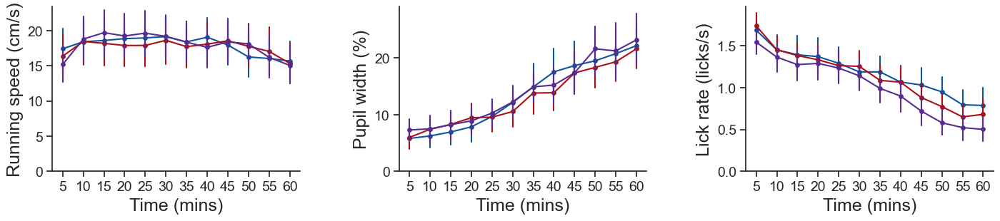

In [87]:
figsize = (17, 3)
fig, ax = plt.subplots(1, 3, figsize=figsize)

i = 0
ax[i] = ppf.plot_mean_response_by_epoch_all_cell_types(running_speed_mdf_images_epochs, metric='mean_response', horizontal=True, ymin=0, 
                                ylabel='Running speed (cm/s)', title='', legend=False, estimator=np.mean, max_epoch=11, ax=ax[i])

i = 1
ax[i] = ppf.plot_mean_response_by_epoch_all_cell_types(pupil_mdf_images_epochs, metric='mean_response', horizontal=True, ymin=0, 
                                ylabel='Pupil width (%)', title='', legend=False, estimator=np.mean, max_epoch=11, ax=ax[i])

i = 2
ax[i] = ppf.plot_mean_response_by_epoch_all_cell_types(lick_rate_mdf_images_epochs, metric='mean_response', horizontal=True, ymin=0, 
                                ylabel='Lick rate (licks/s)', title='', legend=False, estimator=np.mean, max_epoch=11, ax=ax[i])

plt.subplots_adjust(wspace=0.4)

##### Per cre line

In [88]:
# suffix = '_running_speed_images_within_session'
# ppf.plot_mean_response_by_epoch(running_speed_mdf_changes_epochs, metric='mean_response', horizontal=True, ymin=0,
#                                ylabel='Mean running speed (cm/s)', estimator=np.mean, max_epoch=11,
#                                save_dir=save_dir, folder='within_session_behavior',  ax=None)

# # Pupil width by epoch
# suffix = '_pupil_width_images_within_session'
# ppf.plot_mean_response_by_epoch(pupil_mdf_changes_epochs, metric='mean_response', horizontal=True, ymin=0.9,
#                                ylabel='Mean pupil width (%)', estimator=np.mean, max_epoch=11,
#                                save_dir=save_dir, folder='within_session_behavior',  ax=None)

# # Lick rate by epoch
# suffix = '_lick_rate_images_within_session'
# ppf.plot_mean_response_by_epoch(lick_rate_mdf_changes_epochs, metric='mean_response', horizontal=True, ymin=None,
#                                ylabel='Lick rate (licks/s)', estimator=np.mean, ymax=None, max_epoch=11, 
#                                save_dir=save_dir, folder='within_session_behavior', ax=None)

##### Across 10 second bins 

In [89]:
# stim_behavior_response_df is loaded once in the stimulus-based prep cell near the top of the notebook


In [90]:
# stim_behavior_df = stim_behavior_response_df.merge(platform_experiments.reset_index(), 
#                                                             on=['behavior_session_id', 'mouse_id'], how='left')

# # Convert to percentage of baseline                                                       
# stim_behavior_df['mean_pupil_width'] = stim_behavior_df['mean_pupil_width'] - 1
# stim_behavior_df['mean_pupil_width'] = stim_behavior_df['mean_pupil_width'] * 100
# # Start epoch at 1 not zero
# # stim_behavior_df['epoch'] = stim_behavior_df['epoch'] + 1 # change epoch numbering to start at 1 instead of 0 for easier interpretation in plots

# stim_behavior_df.head()

In [91]:
stim_behavior_response_df.columns

Index(['stimulus_presentations_id', 'start_time', 'is_change', 'could_change',
       'is_sham_change', 'auto_rewarded', 'omitted', 'post_omitted',
       'image_name', 'is_image_novel', 'mean_running_speed',
       'mean_pupil_width', 'response_latency', 'lick_latency', 'licked',
       'reward_rate', 'engaged', 'engagement_state', 'behavior_session_id',
       'mouse_id', 'experience_level', 'cell_type'],
      dtype='object')

In [92]:
image_sdf = stim_behavior_response_df.reset_index()
# image_sdf = image_sdf.merge(platform_experiments.drop_duplicates('behavior_session_id')[['behavior_session_id', 'mouse_id', 'experience_level']], on=['behavior_session_id', 'mouse_id'], how='left')
image_sdf = image_sdf[image_sdf.is_change == False]
image_sdf = image_sdf[image_sdf.omitted == False]

# Convert pupil width to percentage of baseline (matches figure_2_main)
image_sdf['mean_pupil_width'] = image_sdf['mean_pupil_width'] - 1
image_sdf['mean_pupil_width'] = image_sdf['mean_pupil_width'] * 100

# relative stimulus number within session
image_sdf['stimulus_number'] = image_sdf.groupby(['mouse_id', 'behavior_session_id']).cumcount() + 1

print(len(image_sdf.mouse_id.unique()))


66


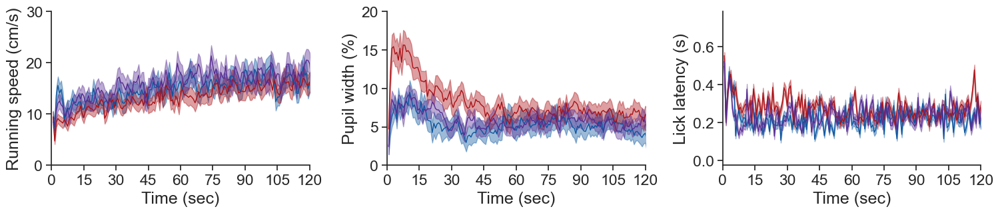

In [93]:
time_window_min = 2

figsize = (18, 3)
fig, ax = plt.subplots(1, 3, figsize=figsize)

i = 0
ax[i] = ppf.plot_metric_across_stimuli_by_experience_level(image_sdf, 'mean_running_speed', time_window_min=time_window_min, 
                                                ylabel='Running speed (cm/s)', title='',  ylim=(0, 30), interval=20,  ax=ax[i])

i = 1
ax[i] = ppf.plot_metric_across_stimuli_by_experience_level(image_sdf, metric='mean_pupil_width', time_window_min=time_window_min, 
                                                ylabel='Pupil width (%)', title='', ylim=(0, 20), interval=20, ax=ax[i])

i = 2
ax[i] = ppf.plot_metric_across_stimuli_by_experience_level(image_sdf, metric='lick_latency', time_window_min=time_window_min, 
                                                 ylabel='Lick latency (s)', title='', ylim=None, interval=20, ax=ax[i])

plt.subplots_adjust(wspace=0.3)

<Axes: title={'center': 'Pupil width over first 2 minutes of session'}, xlabel='Time (sec)', ylabel='Pupil width (%)'>

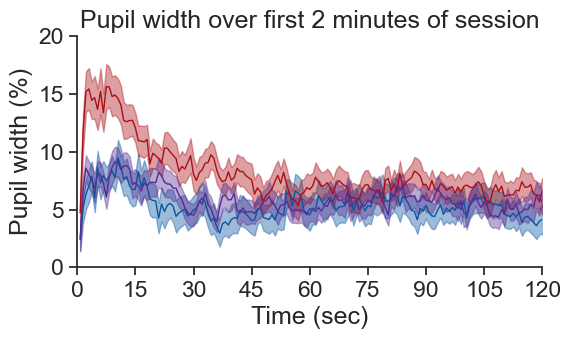

In [94]:
metric = 'mean_pupil_width'
ylabel = 'Pupil width (%)'
time_window_min = 2
ylim = (0, 20)
title = f'Pupil width over first {time_window_min} minutes of session'

ppf.plot_metric_across_stimuli_by_experience_level(image_sdf, metric, time_window_min=time_window_min, 
                                                title=title, ylabel=ylabel, ylim=ylim, 
                                                interval=20, ax=None, save_dir=save_dir, 
                                                folder='within_session_behavior')


<Axes: title={'center': 'Reward rate over time in session'}, xlabel='Time (min)', ylabel='Rewards per minute'>

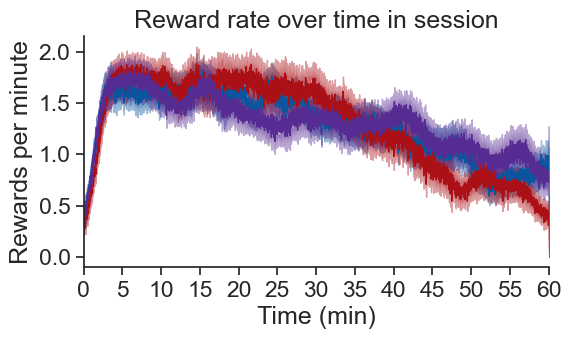

In [95]:
metric = 'reward_rate'
ylabel = 'Rewards per minute'
time_window_min = 60
ylim = None
title = f'Reward rate over time in session'

ppf.plot_metric_across_stimuli_by_experience_level(image_sdf, metric, time_window_min=time_window_min, 
                                                title=title, ylabel=ylabel, ylim=ylim, show_x_in_minutes=True,
                                                interval=400, ax=None, save_dir=save_dir, 
                                                folder='within_session_behavior')

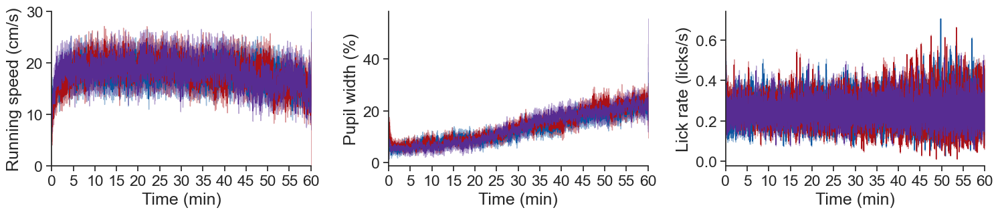

In [96]:
time_window_min = 60

figsize = (18, 3)
fig, ax = plt.subplots(1, 3, figsize=figsize)

i = 0
ax[i] = ppf.plot_metric_across_stimuli_by_experience_level(image_sdf, 'mean_running_speed', time_window_min=time_window_min, show_x_in_minutes=True,
                                                ylabel='Running speed (cm/s)', title='',  ylim=(0, 30), interval=400,  ax=ax[i])

i = 1
ax[i] = ppf.plot_metric_across_stimuli_by_experience_level(image_sdf, metric='mean_pupil_width', time_window_min=time_window_min, show_x_in_minutes=True,
                                                ylabel='Pupil width (%)', title='', ylim=None, interval=400, ax=ax[i])

i = 2
ax[i] = ppf.plot_metric_across_stimuli_by_experience_level(image_sdf, metric='lick_latency', time_window_min=time_window_min, show_x_in_minutes=True,
                                                 ylabel='Lick rate (licks/s)', title='', ylim=None, interval=400, ax=ax[i])

plt.subplots_adjust(wspace=0.3)

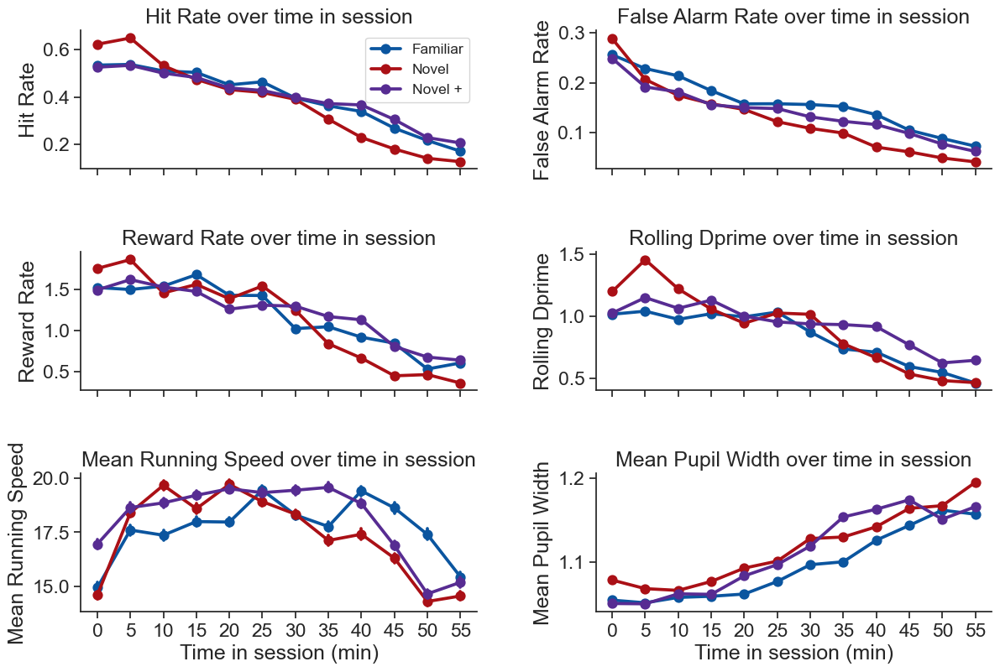

In [97]:
# within-session rolling behavior metrics over time
# (mirrors the stimulus_based_behavior_metrics notebook; uses the rolling df, not per-flash relative_time)
metrics = [m for m in ['hit_rate', 'false_alarm_rate', 'reward_rate', 'rolling_dprime',
                       'mean_running_speed', 'mean_pupil_width']
           if m in rolling_sdf.columns]
ncols = 2
nrows = int(np.ceil(len(metrics) / ncols))
fig, ax = plt.subplots(nrows, ncols, figsize=(14, 3.0 * nrows), sharex=True)
ax = ax.ravel()
experience_level_colors = utils.get_experience_level_colors()

bin_size = 60 * 5  # seconds -> 5-min bins
data = rolling_sdf.reset_index(drop=True).copy()
data = data[data['time_in_session'] < 3600]
data['time_bin'] = ((data['time_in_session'] // bin_size) * bin_size / 60).astype(int)

for i, metric in enumerate(metrics):
    ax[i] = sns.pointplot(data=data, x='time_bin', y=metric, hue='experience_level',
                          palette=experience_level_colors, ax=ax[i])
    ax[i].set_xlabel('Time in session (min)')
    ax[i].set_title(metric.replace('_', ' ').title() + ' over time in session')
    ax[i].set_ylabel(metric.replace('_', ' ').title())
    if ax[i].get_legend() is not None:
        ax[i].get_legend().remove()
for k in range(len(metrics), len(ax)):
    ax[k].axis('off')
ax[0].legend(fontsize='x-small', title_fontsize='x-small')
fig.subplots_adjust(hspace=0.6, wspace=0.3)
plt.show()


### Event aligned behavior

#### Load dataframes for running, pupil, and licks, for both changes & omissions

In [98]:
#### Multi-session dataframes for behavior variables

epoch_duration_mins = None

# Running speed
running_speed_mdf_changes = loading.get_behavior_multi_session_df('running_speed', 'changes', platform_experiments, epoch_duration_mins=epoch_duration_mins)
running_speed_mdf_images = loading.get_behavior_multi_session_df('running_speed', 'images', platform_experiments, epoch_duration_mins=epoch_duration_mins)
running_speed_mdf_omissions = loading.get_behavior_multi_session_df('running_speed', 'omissions', platform_experiments, epoch_duration_mins=epoch_duration_mins)

# Pupil width
pupil_mdf_changes = loading.get_behavior_multi_session_df('pupil_width', 'changes', platform_experiments, epoch_duration_mins=epoch_duration_mins)
pupil_mdf_images = loading.get_behavior_multi_session_df('pupil_width', 'images', platform_experiments, epoch_duration_mins=epoch_duration_mins)
pupil_mdf_omissions = loading.get_behavior_multi_session_df('pupil_width', 'omissions', platform_experiments, epoch_duration_mins=epoch_duration_mins)

# Lick rate
lick_rate_mdf_changes = loading.get_behavior_multi_session_df('lick_rate', 'changes', platform_experiments, epoch_duration_mins=epoch_duration_mins)
lick_rate_mdf_images = loading.get_behavior_multi_session_df('lick_rate', 'images', platform_experiments, epoch_duration_mins=epoch_duration_mins)
lick_rate_mdf_omissions = loading.get_behavior_multi_session_df('lick_rate', 'omissions', platform_experiments, epoch_duration_mins=epoch_duration_mins)

/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_running_speed_all_is_change_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_running_speed_all_is_change_platform_experiment_table.pkl
there are 1880 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_running_speed_all_is_change_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_running_speed_all_is_change_platform_experiment_table.pkl
there are 1880 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_running_speed_all_omitted_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_running_speed_all_omitted_platform_experiment_table.pkl
there are 1880 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_pupil_width_all_is_change_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_pupil_width_all_is_change_platform_experiment_table.pkl
there are 1876 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_pupil_width_all_is_change_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_pupil_width_all_is_change_platform_experiment_table.pkl
there are 1876 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_pupil_width_all_omitted_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_pupil_width_all_omitted_platform_experiment_table.pkl
there are 1876 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 401 experiments in the multi_session_df after limiting to platform experiments
there are 401 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_lick_rate_all_is_change_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_lick_rate_all_is_change_platform_experiment_table.pkl
there are 1602 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_lick_rate_all_is_change_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_lick_rate_all_is_change_platform_experiment_table.pkl
there are 1602 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/boto3/compat.py:89: PythonDeprecationWarning: Boto3 will no longer support Python 3.9 starting April 29, 2026. To continue receiving service updates, bug fixes, and security updates please upgrade to Python 3.10 or later. More information can be found here: https://aws.amazon.com/blogs/developer/python-support-policy-updates-for-aws-sdks-and-tools/
  warnings.warn(warning, PythonDeprecationWarning)
/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_bl

1936
loading files from /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs
mean_response_df_lick_rate_all_omitted_platform_experiment_table.pkl
loading multi_session_df from saved file at /Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/visual_behavior_ophys_multi_session_dfs/mean_response_df_lick_rate_all_omitted_platform_experiment_table.pkl
there are 1602 experiments in the full multi_session_df


/opt/miniconda3/envs/visual_behavior_sdk/lib/python3.9/site-packages/allensdk/brain_observatory/behavior/behavior_project_cache/behavior_project_cache.py:135: UpdatedStimulusPresentationTableWarning: 
	As of AllenSDK version 2.16.0, the latest Visual Behavior Ophys data has been significantly updated from previous releases. Specifically the user will need to update all processing of the stimulus_presentations tables. These tables now include multiple stimulus types delineated by the columns `stimulus_block` and `stimulus_block_name`.

The data that was available in previous releases are stored in the block name containing 'change_detection' and can be accessed in the pandas table by using: 
	`stimulus_presentations[stimulus_presentations.stimulus_block_name.str.contains('change_detection')]`
  warnings.warn(


removing 1 problematic experiments
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


In [99]:
print(len(pupil_mdf_omissions.behavior_session_id.unique()))
print(len(pupil_mdf_omissions.mouse_id.unique()))


201
66


In [100]:
print(len(pupil_mdf_changes.behavior_session_id.unique()))
print(len(pupil_mdf_changes.mouse_id.unique()))


201
66


In [101]:
print(len(running_speed_mdf_omissions.behavior_session_id.unique()))
print(len(running_speed_mdf_omissions.mouse_id.unique()))


202
66


In [102]:
print(len(running_speed_mdf_changes.behavior_session_id.unique()))
print(len(running_speed_mdf_changes.mouse_id.unique()))


202
66


In [103]:
print(len(lick_rate_mdf_omissions.behavior_session_id.unique()))
print(len(lick_rate_mdf_omissions.mouse_id.unique()))


202
66


In [104]:
print(len(lick_rate_mdf_changes.behavior_session_id.unique()))
print(len(lick_rate_mdf_changes.mouse_id.unique()))


202
66


#### Combined plot including lick rate

table includes 66 mice


/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2259: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


table includes 66 mice


/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2259: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


table includes 66 mice


/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2259: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


table includes 66 mice


/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2259: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


table includes 66 mice


/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2259: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


table includes 66 mice


/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2259: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


Text(1498.1494156928186, 0.5, '')

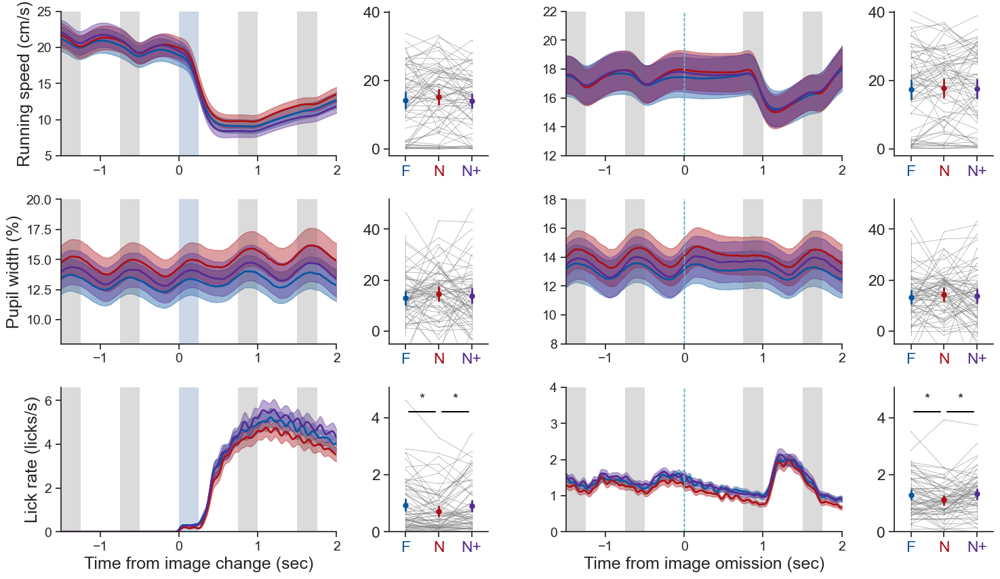

In [105]:
axes_column = 'expts'
hue_column = 'experience_level'
xlim_seconds = [-1.5, 2]
interval_sec = 1

figsize = [2 * 12, 2 * 10]
fig = plt.figure(figsize=figsize)


#### Running 

#### Changes

df = running_speed_mdf_changes.copy()
df['expts'] = 'all'

ylims = (-2, 35)
ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[0, 0.22], yspan=[0, 0.14], wspace=None, hspace=None,
                    sharex=False, sharey=False, width_ratios=None, height_ratios=None)
ax = ppf.plot_population_averages_for_condition(df, 'running_speed', 'changes', hue_column, 
                                                ylabel='Running speed (cm/s)', linewidth=2, ylims=(5, 25),
                                                xlim_seconds=xlim_seconds, interval_sec=interval_sec,
                                                xlabel='Time from image change (sec)', ax=ax)
ax.set_xlabel('')

ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[.26, 0.34], yspan=[0, 0.14], wspace=None, hspace=None,
                    sharex=False, sharey=False, width_ratios=None, height_ratios=None)
ax = ppf.plot_metric_distribution_by_experience_no_cell_type(df, 'mean_response', 'changes', 'running_speed', 
                                            ylabel='', ylims=ylims, show_mice=True,
                                            pointplot=True, stripplot=False, horiz=False, title='',ax=ax)
ax.set_ylabel('')



#### Omissions 

df = running_speed_mdf_omissions.copy()
df['expts'] = 'all'
ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[.4, 0.62], yspan=[0, 0.14], wspace=None, hspace=None,
                    sharex=False, sharey=False, width_ratios=None, height_ratios=None)
ax = ppf.plot_population_averages_for_condition(df, 'running_speed', 'omissions', hue_column, ylims=(12, 22),
                                                ylabel='Running speed (cm/s)', xlim_seconds=xlim_seconds, linewidth=2, 
                                                interval_sec=interval_sec, xlabel='Time from image omission (sec)', ax=ax)
ax.set_xlabel('')
ax.set_ylabel('')

ylims = (-2, 35)
ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[.66, 0.74], yspan=[0, 0.14], wspace=None, hspace=None,
                    sharex=False, sharey=False, width_ratios=None, height_ratios=None)
ax = ppf.plot_metric_distribution_by_experience_no_cell_type(df, 'mean_response', 'omissions', 'running_speed', 
                                            ylabel='', ylims=ylims, show_mice=True,
                                            pointplot=True, stripplot=False, horiz=False, title='', ax=ax)
ax.set_ylabel('')


#### Pupil 

#### Changes


df = pupil_mdf_changes.copy()
df['expts'] = 'all'
ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[0.0, 0.22], yspan=[0.18, 0.32], wspace=None, hspace=None,
                    sharex=False, sharey=False, width_ratios=None, height_ratios=None)
ax = ppf.plot_population_averages_for_condition(df, 'pupil_width', 'changes', hue_column, ylims=(8, 20),
                                                ylabel='Pupil width (%)', xlim_seconds=xlim_seconds, linewidth=2, 
                                                interval_sec=interval_sec, xlabel='Time from image change (sec)', ax=ax)
ax.set_xlabel('')

ylims = (-5, 45)
ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[0.26, 0.34], yspan=[0.18, 0.32], wspace=None, hspace=None,
                    sharex=False, sharey=False, width_ratios=None, height_ratios=None)
ax = ppf.plot_metric_distribution_by_experience_no_cell_type(df, 'mean_response', 'changes', 'pupil_width', 
                                            ylabel='', ylims=ylims, show_mice=True,
                                            pointplot=True, stripplot=False, horiz=False, title='', ax=ax)
ax.set_ylabel('')


#### Omissions

df = pupil_mdf_omissions.copy()
ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[.4, 0.62], yspan=[0.18, 0.32], wspace=None, hspace=None,
                    sharex=False, sharey=False, width_ratios=None, height_ratios=None)
ax = ppf.plot_population_averages_for_condition(df, 'pupil_width', 'omissions', hue_column, ylims=(8, 18),
                                                ylabel='Pupil width (%)', xlim_seconds=xlim_seconds, linewidth=2, 
                                                interval_sec=interval_sec, xlabel='Time from image omission (sec)', ax=ax)
ax.set_ylabel('')
ax.set_xlabel('')

ylims = (-5, 45)
ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[.66, 0.74], yspan=[0.18, 0.32], wspace=None, hspace=None,
                    sharex=False, sharey=False, width_ratios=None, height_ratios=None)
ax = ppf.plot_metric_distribution_by_experience_no_cell_type(df, 'mean_response', 'omissions', 'pupil_width', 
                                            ylabel='', ylims=ylims, show_mice=True,
                                            pointplot=True, stripplot=False, horiz=False, title='', ax=ax)
ax.set_ylabel('')


#### Lick rate

#### Changes

df = lick_rate_mdf_changes.copy()
# df['mean_trace'] = [mean_trace*10 for mean_trace in df.mean_trace.values]
# df['mean_response'] = [mean_response*10 for mean_response in df.mean_response.values]

df['expts'] = 'all'
ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[0.0, 0.22], yspan=[0.36, 0.50], wspace=None, hspace=None,
                    sharex=False, sharey=False, width_ratios=None, height_ratios=None)
ax = ppf.plot_population_averages_for_condition(df, 'lick_rate', 'changes', hue_column, 
                                                ylabel='Lick rate (licks/s)', linewidth=2, ylims=(0, 6.6),
                                                xlim_seconds=xlim_seconds, interval_sec=interval_sec,
                                                xlabel='Time from image change (sec)', ax=ax)

ylims_lick = None
ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[0.26, 0.34], yspan=[0.36, 0.50], wspace=None, hspace=None,
                    sharex=False, sharey=False, width_ratios=None, height_ratios=None)
ax = ppf.plot_metric_distribution_by_experience_no_cell_type(df, 'mean_response', 'changes', 'lick_rate', 
                                            ylabel='', ylims=(0, 4), show_mice=True,
                                            pointplot=True, stripplot=False, horiz=False, title='', ax=ax)
ax.set_ylabel('')


#### Omissions

df = lick_rate_mdf_omissions.copy()
# df['mean_trace'] = [mean_trace*10 for mean_trace in df.mean_trace.values]
# df['mean_response'] = [mean_response*10 for mean_response in df.mean_response.values]

df['expts'] = 'all'
ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[.4, 0.62], yspan=[0.36, 0.50], wspace=None, hspace=None,
                    sharex=False, sharey=False, width_ratios=None, height_ratios=None)
ax = ppf.plot_population_averages_for_condition(df, 'lick_rate', 'omissions', hue_column, ylims=(0, 4),
                                                ylabel='Lick rate (licks/s)', xlim_seconds=xlim_seconds, linewidth=2, 
                                                interval_sec=interval_sec, xlabel='Time from image omission (sec)', ax=ax)
ax.set_ylabel('')

ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[.66, 0.74], yspan=[0.36, 0.50], wspace=None, hspace=None,
                    sharex=False, sharey=False, width_ratios=None, height_ratios=None)
ax = ppf.plot_metric_distribution_by_experience_no_cell_type(df, 'mean_response', 'omissions', 'lick_rate', 
                                            ylabel='', ylims=(0, 4), show_mice=True,
                                            pointplot=True, stripplot=False, horiz=False, title='', ax=ax)
ax.set_ylabel('')

##### Combined plot reoriented

Skip the per session averages, just show the timeseries,
organize with first row as changes and second row as omissions, 
and columns organized by behavior metric.


### Custom Functions for Behavior-Response Analysis

In [106]:
def plot_correlation_of_behavior_and_cell_metrics(behavior_metrics, cell_metrics,
                                                  behavior_metric, cell_metric, use_median=True,
                                                  save_dir=None, folder=None):
    """
    Plot correlation between behavior metrics and cell metrics.

    Parameters
    ----------
    behavior_metrics : pd.DataFrame
        Table containing behavior metrics with behavior_session_id
    cell_metrics : pd.DataFrame
        Table containing cell metrics
    behavior_metric : str
        Column name for behavior metric
    cell_metric : str
        Column name for cell metric
    use_median : bool
        If True, group and take median; if False, take mean
    save_dir : str, optional
        Directory to save figure
    folder : str, optional
        Subfolder for saving
    """
    metrics = [cell_metric, behavior_metric]

    # Prepare data
    behavior_metrics_prep = behavior_metrics[[behavior_metric, 'behavior_session_id']]
    metric_data = cell_metrics.merge(behavior_metrics_prep, on='behavior_session_id')

    # Group and compute statistics
    if use_median:
        data = metric_data.groupby(['behavior_session_id', 'experience_level', 'cell_type']).median()[metrics].reset_index()
    else:
        data = metric_data.groupby(['behavior_session_id', 'experience_level', 'cell_type']).mean()[metrics].reset_index()

    # Plot
    figsize = (15, 4)
    fig, ax = plt.subplots(1, 3, figsize=figsize)
    for i, cell_type in enumerate(cell_types):
        ax[i] = sns.scatterplot(data=data[data.cell_type == cell_type], x=behavior_metric, y=cell_metric,
                               hue='experience_level', palette=experience_colors, ax=ax[i])
        ax[i].set_title(cell_type)
        ax[i].get_legend().remove()
    ax[i].legend(bbox_to_anchor=(1, 1), fontsize=10, title_fontsize=10)
    plt.subplots_adjust(wspace=0.4)

    if save_dir:
        filename = 'correlation_' + cell_metric + '_' + behavior_metric
        utils.save_figure(fig, figsize, save_dir, folder, filename)


def get_metric_index_name(metric, exp_level_1='Familiar', exp_level_2='Novel'):
    """Get the name for metric difference index."""
    metric_name = 'delta_' + exp_level_1 + '_' + exp_level_2 + '_' + metric
    return metric_name


def get_difference_in_metric_across_experience_levels(metrics_table, metric,
                                                      groupby=['cell_specimen_id', 'experience_level'],
                                                      exp_level_1='Familiar', exp_level_2='Novel',
                                                      compute_index=True):
    """
    Compute difference in metric values across experience levels.

    Parameters
    ----------
    metrics_table : pd.DataFrame
        Table with metrics and experience level
    metric : str
        Column name of metric to compute difference for
    groupby : list
        Columns to group by
    exp_level_1 : str
        First experience level
    exp_level_2 : str
        Second experience level
    compute_index : bool
        If True, compute normalized index; if False, compute raw difference

    Returns
    -------
    pd.DataFrame
        Table with difference metric column added
    """
    # Group and compute mean
    metrics = metrics_table.groupby(groupby).mean(numeric_only=True)[[metric]]
    metrics = metrics.unstack()
    metrics.columns = metrics.columns.droplevel(0)

    # Compute difference
    metric_name = get_metric_index_name(metric, exp_level_1=exp_level_1, exp_level_2=exp_level_2)
    if compute_index:
        metrics[metric_name] = (metrics[exp_level_2] - metrics[exp_level_1]) / (metrics[exp_level_2] + metrics[exp_level_1])
    else:
        metrics[metric_name] = (metrics[exp_level_2] - metrics[exp_level_1])

    return metrics


def get_change_in_behavior_and_average_cell_metric_across_mice(cell_metrics_table, behavior_metrics_table,
                                                               platform_experiments_table,
                                                               behavior_metric='mean_dprime_engaged',
                                                               cell_metric='mean_response_pref_image',
                                                               avg_diff_per_cell=True):
    """
    Get change in behavior and cell metrics across experience levels for each mouse.

    Parameters
    ----------
    cell_metrics_table : pd.DataFrame
        Table with cell metrics
    behavior_metrics_table : pd.DataFrame
        Table with behavior metrics
    platform_experiments_table : pd.DataFrame
        Platform experiments table with metadata
    behavior_metric : str
        Name of behavior metric column
    cell_metric : str
        Name of cell metric column
    avg_diff_per_cell : bool
        If True, compute difference per cell first then average by mouse
        If False, average metric per experience level first then compute difference per mouse

    Returns
    -------
    pd.DataFrame
        Merged table with difference metrics for each mouse
    """
    if avg_diff_per_cell:
        # Compute difference across experience for each cell, then average within each mouse
        cell_metrics = get_difference_in_metric_across_experience_levels(cell_metrics_table, cell_metric,
                                                                        groupby=['cell_specimen_id', 'experience_level'],
                                                                        exp_level_1='Familiar', exp_level_2='Novel',
                                                                        compute_index=True)
        # Merge with metadata to get mouse ID
        cell_metrics = cell_metrics.reset_index()
        # Load platform cells table to get mouse_id mapping
        platform_cache_dir = loading.get_platform_analysis_cache_dir()
        platform_cells_table = pd.read_csv(os.path.join(platform_cache_dir, 'platform_paper_ophys_cells_table.csv'), index_col=0)
        cell_metrics = cell_metrics.merge(platform_cells_table[['cell_specimen_id', 'mouse_id']], on='cell_specimen_id')
        # Average across cells per mouse
        metric_name = get_metric_index_name(cell_metric)
        cell_metrics = cell_metrics.groupby(['mouse_id']).mean()[[metric_name]]
    else:
        # Get average value per mouse then take the difference across experience levels
        cell_metrics = get_difference_in_metric_across_experience_levels(cell_metrics_table, cell_metric,
                                                                        groupby=['mouse_id', 'experience_level'],
                                                                        exp_level_1='Familiar', exp_level_2='Novel',
                                                                        compute_index=True)

    # Limit behavior metrics to sessions with ophys
    behavior_stats = behavior_metrics_table.copy()
    behavior_stats = behavior_stats[behavior_stats.behavior_session_id.isin(platform_experiments_table.behavior_session_id.unique())]

    # Compute behavior metric difference across experience levels
    behavior_metrics_diff = get_difference_in_metric_across_experience_levels(behavior_stats, behavior_metric,
                                                                             groupby=['mouse_id', 'experience_level'],
                                                                             exp_level_1='Familiar', exp_level_2='Novel',
                                                                             compute_index=False)

    # Merge tables
    metric_data = cell_metrics[[get_metric_index_name(cell_metric)]].merge(
        behavior_metrics_diff[[get_metric_index_name(behavior_metric)]], on='mouse_id')

    # Add metadata
    metric_data = metric_data.merge(platform_experiments_table[['mouse_id', 'cell_type']].drop_duplicates(), on='mouse_id')

    return metric_data

## Figure S5 composite


In [107]:
# ============================================================
# Stim-based data prep for the supplemental composite -- recomputed from stimulus_behavior_response_df,
# auto-rewarded warm-up period dropped per session.
# ============================================================
import visual_behavior.utilities as vbu

sbr_trim = vbu.drop_autorewarded_warmup(stim_behavior_response_df)

session_meta = (platform_experiments[['behavior_session_id', 'mouse_id', 'experience_level', 'cell_type']]
                .drop_duplicates('behavior_session_id'))

# rolling df with mouse_id + experience (carries reward_rate, running speed, pupil from the updated function)
rolling_mouse = (vbu.get_stimulus_based_rolling_performance_df_for_dataset(
        sbr_trim, session_key='behavior_session_id', response_col='licked')
    .merge(session_meta[['behavior_session_id', 'mouse_id', 'experience_level']],
           on='behavior_session_id', how='left'))

def _opp(sp):
    go = sp[(sp.auto_rewarded == False) & (sp.could_change == True) & (sp.is_change == True)]
    catch = sp[(sp.auto_rewarded == False) & (sp.could_change == True) & (sp.is_change == False)]
    return pd.Series({
        'hit_rate': go['licked'].mean(),
        'fa_rate': catch['licked'].mean(),
        'dprime': vbu.dprime(go_trials=go['licked'], catch_trials=catch['licked'], limits=True),
        'n_go': len(go),
    })
# engagement for the composite A-E panels defined as reward_rate > 1 reward/min
# (more lenient than the threshold-2 engagement_state used elsewhere); scoped to this composite.
ENGAGEMENT_REWARD_RATE_THRESHOLD = 1
def _sess(sp):
    whole = _opp(sp)
    eng = _opp(sp[sp['reward_rate'] > ENGAGEMENT_REWARD_RATE_THRESHOLD]).add_suffix('_engaged')
    opps = sp[(sp.auto_rewarded == False) & (sp.could_change == True)]
    frac = pd.Series({'fraction_engaged': (opps['reward_rate'] > ENGAGEMENT_REWARD_RATE_THRESHOLD).mean()})
    return pd.concat([whole, eng, frac])
def _roll(roll):
    eng = roll.loc[roll['reward_rate'] > ENGAGEMENT_REWARD_RATE_THRESHOLD, 'rolling_dprime']
    return pd.Series({'mean_dprime': roll['rolling_dprime'].mean(), 'max_dprime': roll['rolling_dprime'].max(),
                      'mean_dprime_engaged': eng.mean(), 'max_dprime_engaged': eng.max()})
stim_stats = (sbr_trim.groupby('behavior_session_id').apply(_sess)
              .join(rolling_mouse.groupby('behavior_session_id').apply(_roll))
              .reset_index().merge(session_meta, on='behavior_session_id', how='left'))
print('stim_stats:', stim_stats.shape, '| rolling_mouse cols:', [c for c in rolling_mouse.columns if c in
      ('hit_rate','false_alarm_rate','rolling_dprime','reward_rate','mean_running_speed','mean_pupil_width')])

/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/utilities.py:542: RuntimeWarning: invalid value encountered in subtract
  d_prime = Z(hit_rate.fillna(0)) - Z(fa_rate.fillna(0))
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/utilities.py:542: RuntimeWarning: invalid value encountered in subtract
  d_prime = Z(hit_rate.fillna(0)) - Z(fa_rate.fillna(0))
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/utilities.py:542: RuntimeWarning: invalid value encountered in subtract
  d_prime = Z(hit_rate.fillna(0)) - Z(fa_rate.fillna(0))
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/utilities.py:542: RuntimeWarning: invalid value encountered in subtract
  d_prime = Z(hit_rate.fillna(0)) - Z(fa_rate.fillna(0))
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/utilities.py:542: RuntimeWarning: invalid value encountered in subtract
  d_prime = Z(hit_rate.fillna(0)) - Z(fa_rate.fillna(0))


stim_stats: (202, 17) | rolling_mouse cols: ['hit_rate', 'false_alarm_rate', 'rolling_dprime', 'reward_rate', 'mean_running_speed', 'mean_pupil_width']


table includes 66 mice


/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2259: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


table includes 66 mice


/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2259: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


table includes 66 mice


/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2259: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


table includes 66 mice


/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2259: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


table includes 66 mice


/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2259: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


table includes 66 mice


/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:2259: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(utils.get_abbreviated_experience_levels(), rotation=0)


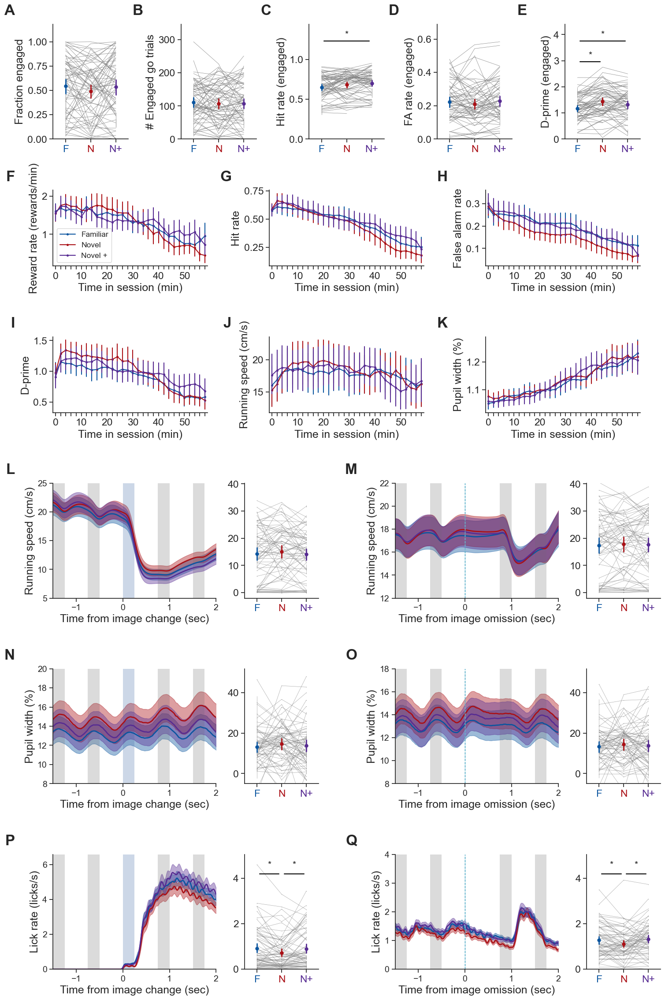

In [108]:
# Composite Figure S5 - Extended behavioral analysis (stimulus-based)
#   A-E: per-session engaged stim metrics (engaged = reward_rate > 1): fraction engaged, # engaged go trials,
#        hit rate, FA rate, mean d-prime
#   F-K: rolling metrics over time in session (reward, hit, FA | d-prime, running, pupil), error bars ACROSS MICE
#   L-Q: event-aligned behavior (change | omission) -- unchanged
# Requires the stim-based prep cell above (stim_stats, rolling_mouse) plus the event-aligned mdfs for L-Q.

colors = utils.get_experience_level_colors()
figsize = (20, 26)
fig = plt.figure(figsize=figsize)


def panel_label(ax, label, dx=-62, dy=10):
    ax.annotate(label, xy=(0, 1), xycoords='axes fraction',
                xytext=(dx, dy), textcoords='offset points',
                fontsize=24, fontweight='bold', va='bottom', ha='right',
                annotation_clip=False)


# ============================================================
# Row 1 - Panels A-E: per-session stim behavior metrics by experience level
# ============================================================
ax_AE = utils.placeAxesOnGrid(fig, dim=[1, 5], xspan=[0.06, 0.92], yspan=[0.02, 0.14], wspace=0.7)
for j, (metric, ylabel) in enumerate([
        ('fraction_engaged', 'Fraction engaged'),
        ('n_go_engaged', '# Engaged go trials'),
        ('hit_rate_engaged', 'Hit rate (engaged)'),
        ('fa_rate_engaged', 'FA rate (engaged)'),
        ('mean_dprime_engaged', 'D-prime (engaged)')]):
    ax_AE[j] = ppf.plot_behavior_metric_by_experience(
        stim_stats, metric, title='', ylabel=ylabel, ylims=None,
        show_mice=True, best_image=False, plot_stats=True, stripplot=False, show_ns=False,
        save_dir=None, ax=ax_AE[j])
for ax, lbl in zip(ax_AE, ['A', 'B', 'C', 'D', 'E']):
    panel_label(ax, lbl)


# ============================================================
# Rows 2-3 - Panels F-K: rolling metrics over time in session (error bars across mice)
# ============================================================
ax_FH = utils.placeAxesOnGrid(fig, dim=[1, 3], xspan=[0.06, 0.92], yspan=[0.19, 0.27], wspace=0.4)
for j, (metric, ylabel) in enumerate([
        ('reward_rate', 'Reward rate (rewards/min)'),
        ('hit_rate', 'Hit rate'),
        ('false_alarm_rate', 'False alarm rate')]):
    ax_FH[j] = ppf.plot_rolling_metric_over_time_in_session(
        rolling_mouse, metric=metric, bin_size_seconds=120, max_minutes=60,
        label_every=5, ylabel=ylabel, ax=ax_FH[j])
    if ax_FH[j].get_legend() is not None:
        ax_FH[j].get_legend().remove()
ax_FH[0].legend(fontsize='x-small', title_fontsize='x-small')
for ax, lbl in zip(ax_FH, ['F', 'G', 'H']):
    panel_label(ax, lbl)

ax_IK = utils.placeAxesOnGrid(fig, dim=[1, 3], xspan=[0.06, 0.92], yspan=[0.34, 0.42], wspace=0.4)
for j, (metric, ylabel) in enumerate([
        ('rolling_dprime', 'D-prime'),
        ('mean_running_speed', 'Running speed (cm/s)'),
        ('mean_pupil_width', 'Pupil width (%)')]):
    if metric not in rolling_mouse.columns:
        ax_IK[j].axis('off')
        continue
    ax_IK[j] = ppf.plot_rolling_metric_over_time_in_session(
        rolling_mouse, metric=metric, bin_size_seconds=120, max_minutes=60,
        label_every=5, ylabel=ylabel, ax=ax_IK[j])
    if ax_IK[j].get_legend() is not None:
        ax_IK[j].get_legend().remove()
for ax, lbl in zip(ax_IK, ['I', 'J', 'K']):
    panel_label(ax, lbl)


# ============================================================
# Rows 4-6 - Panels L-Q: event-aligned behavior (change | omission), unchanged
# ============================================================
hue_column = 'experience_level'
xlim_seconds = [-1.5, 2]
interval_sec = 1

xspan_change_trace = [0.06, 0.30]
xspan_change_avg = [0.34, 0.45]
xspan_omit_trace = [0.56, 0.80]
xspan_omit_avg = [0.84, 0.95]

event_rows = [
    ('running_speed', running_speed_mdf_changes, running_speed_mdf_omissions,
     'Running speed (cm/s)', (5, 25), (12, 22), (-2, 35), 'L', 'M', [0.49, 0.61]),
    ('pupil_width', pupil_mdf_changes, pupil_mdf_omissions,
     'Pupil width (%)', (8, 20), (8, 18), (-5, 45), 'N', 'O', [0.68, 0.80]),
    ('lick_rate', lick_rate_mdf_changes, lick_rate_mdf_omissions,
     'Lick rate (licks/s)', (0, 6.6), (0, 4), (0, 4), 'P', 'Q', [0.87, 0.99]),
]

for (data_type, df_chg, df_omit, ylabel, ylims_chg, ylims_omit,
     avg_ylims, panel_chg, panel_omit, yspan) in event_rows:

    df = df_chg.copy(); df['expts'] = 'all'
    ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=xspan_change_trace, yspan=yspan)
    ax = ppf.plot_population_averages_for_condition(
        df, data_type, 'changes', hue_column, ylabel=ylabel, linewidth=2, ylims=ylims_chg,
        xlim_seconds=xlim_seconds, interval_sec=interval_sec,
        xlabel='Time from image change (sec)', ax=ax)
    panel_label(ax, panel_chg)
    ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=xspan_change_avg, yspan=yspan)
    ax = ppf.plot_metric_distribution_by_experience_no_cell_type(
        df, 'mean_response', 'changes', data_type, ylabel='', ylims=avg_ylims,
        show_mice=True, pointplot=True, stripplot=False, horiz=False, title='', ax=ax)
    ax.set_ylabel('')

    df = df_omit.copy(); df['expts'] = 'all'
    ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=xspan_omit_trace, yspan=yspan)
    ax = ppf.plot_population_averages_for_condition(
        df, data_type, 'omissions', hue_column, ylabel=ylabel, linewidth=2, ylims=ylims_omit,
        xlim_seconds=xlim_seconds, interval_sec=interval_sec,
        xlabel='Time from image omission (sec)', ax=ax)
    panel_label(ax, panel_omit)
    ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=xspan_omit_avg, yspan=yspan)
    ax = ppf.plot_metric_distribution_by_experience_no_cell_type(
        df, 'mean_response', 'omissions', data_type, ylabel='', ylims=avg_ylims,
        show_mice=True, pointplot=True, stripplot=False, horiz=False, title='', ax=ax)
    ax.set_ylabel('')


utils.save_figure(fig, figsize, save_dir, 'composite', 'figure_S5_composite')

## Figure S5 composite (v2)

Within-session rolling metrics first (A-F), then across-session engaged metrics (G-K), then event-aligned timeseries only (L-Q) as 2 rows (change / omission) x 3 columns (running / pupil / lick) -- the across-session distribution panels are dropped. Original supplemental composite is left intact above.

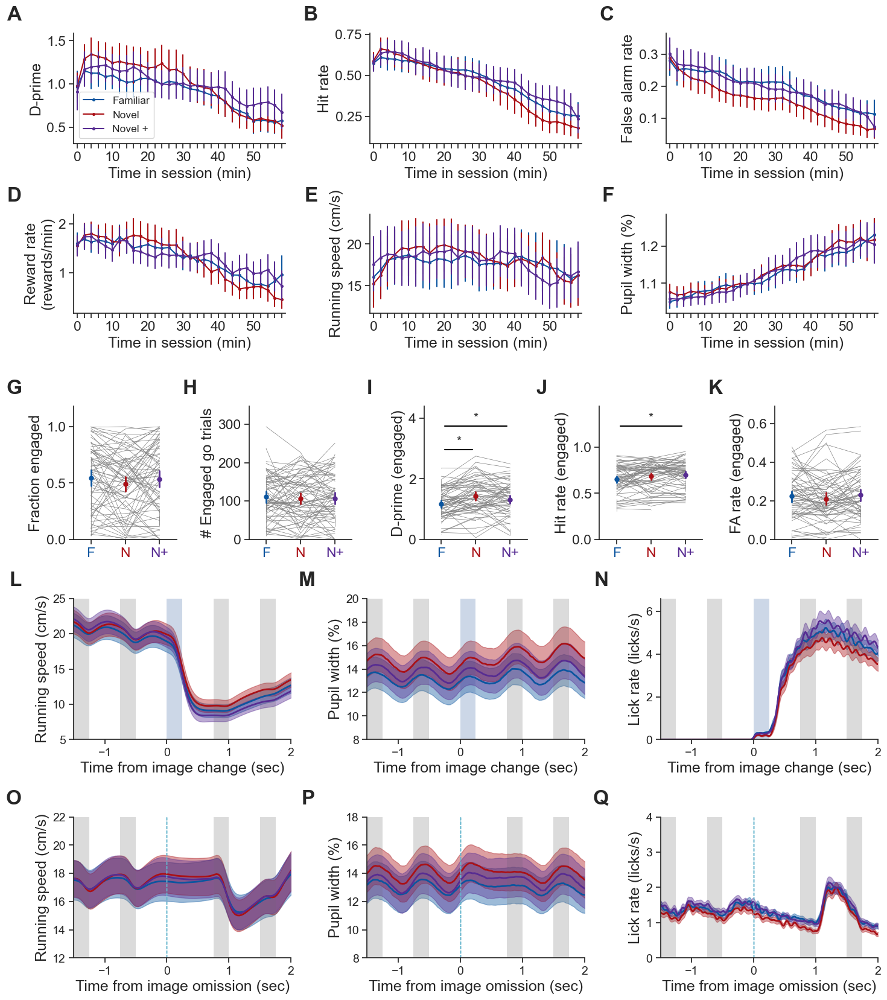

In [109]:
# Composite Figure 2 supplemental - alternate arrangement (v2). Original is left intact above.
#   A-F  within-session rolling (A reward, B hit, C FA | D d-prime, E running, F pupil)
#   G-K  across-session engaged (G fraction engaged, H # engaged go, I hit, J FA, K mean d-prime)
#   L-Q  event-aligned timeseries only: rows = change / omission, cols = running / pupil / lick
# Requires the supplemental composite prep cell above (stim_stats, rolling_mouse) and the event-aligned mdfs.

colors = utils.get_experience_level_colors()
figsize = (20, 22)
fig = plt.figure(figsize=figsize)

def panel_label(ax, label, dx=-62, dy=10):
    ax.annotate(label, xy=(0, 1), xycoords='axes fraction',
                xytext=(dx, dy), textcoords='offset points',
                fontsize=24, fontweight='bold', va='bottom', ha='right',
                annotation_clip=False)

# ============================================================
# A-F: within-session rolling metrics (error bars across mice), two rows of three
# ============================================================
ax_AC = utils.placeAxesOnGrid(fig, dim=[1, 3], xspan=[0.06, 0.92], yspan=[0.03, 0.13], wspace=0.4)
for j, (metric, ylabel) in enumerate([
        ('rolling_dprime', 'D-prime'),
        ('hit_rate', 'Hit rate'),
        ('false_alarm_rate', 'False alarm rate')]):
    ax_AC[j] = ppf.plot_rolling_metric_over_time_in_session(
        rolling_mouse, metric=metric, bin_size_seconds=120, max_minutes=60,
        label_every=5, ylabel=ylabel, ax=ax_AC[j])
    if ax_AC[j].get_legend() is not None:
        ax_AC[j].get_legend().remove()
ax_AC[0].legend(fontsize='x-small', title_fontsize='x-small')
for ax, lbl in zip(ax_AC, ['A', 'B', 'C']):
    panel_label(ax, lbl)

ax_DF = utils.placeAxesOnGrid(fig, dim=[1, 3], xspan=[0.06, 0.92], yspan=[0.19, 0.29], wspace=0.4)
for j, (metric, ylabel) in enumerate([
        ('reward_rate', 'Reward rate\n(rewards/min)'),
        ('mean_running_speed', 'Running speed (cm/s)'),
        ('mean_pupil_width', 'Pupil width (%)')]):
    if metric not in rolling_mouse.columns:
        ax_DF[j].axis('off')
        continue
    ax_DF[j] = ppf.plot_rolling_metric_over_time_in_session(
        rolling_mouse, metric=metric, bin_size_seconds=120, max_minutes=60,
        label_every=5, ylabel=ylabel, ax=ax_DF[j])
    if ax_DF[j].get_legend() is not None:
        ax_DF[j].get_legend().remove()
for ax, lbl in zip(ax_DF, ['D', 'E', 'F']):
    panel_label(ax, lbl)

# ============================================================
# G-K: across-session engaged stim metrics by experience level
# ============================================================
ax_GK = utils.placeAxesOnGrid(fig, dim=[1, 5], xspan=[0.06, 0.92], yspan=[0.36, 0.48], wspace=0.7)
for j, (metric, ylabel) in enumerate([
        ('fraction_engaged', 'Fraction engaged'),
        ('n_go_engaged', '# Engaged go trials'),
        ('mean_dprime_engaged', 'D-prime (engaged)'),
        ('hit_rate_engaged', 'Hit rate (engaged)'),
        ('fa_rate_engaged', 'FA rate (engaged)')]):
    ax_GK[j] = ppf.plot_behavior_metric_by_experience(
        stim_stats, metric, title='', ylabel=ylabel, ylims=None,
        show_mice=True, best_image=False, plot_stats=True, stripplot=False, show_ns=False,
        save_dir=None, ax=ax_GK[j])
for ax, lbl in zip(ax_GK, ['G', 'H', 'I', 'J', 'K']):
    panel_label(ax, lbl)

# ============================================================
# L-Q: event-aligned timeseries only -- rows = change / omission, cols = running / pupil / lick
# ============================================================
hue_column = 'experience_level'
xlim_seconds = [-1.5, 2]
interval_sec = 1
behaviors = [
    ('running_speed', running_speed_mdf_changes, running_speed_mdf_omissions, 'Running speed (cm/s)', (5, 25), (12, 22)),
    ('pupil_width', pupil_mdf_changes, pupil_mdf_omissions, 'Pupil width (%)', (8, 20), (8, 18)),
    ('lick_rate', lick_rate_mdf_changes, lick_rate_mdf_omissions, 'Lick rate (licks/s)', (0, 6.6), (0, 4)),
]
ax_LQ = utils.placeAxesOnGrid(fig, dim=[2, 3], xspan=[0.06, 0.92], yspan=[0.53, 0.85], wspace=0.35, hspace=0.55)
labels = [['L', 'M', 'N'], ['O', 'P', 'Q']]
for j, (data_type, df_chg, df_omit, ylabel, ylims_chg, ylims_omit) in enumerate(behaviors):
    # row 0: change
    df = df_chg.copy(); df['expts'] = 'all'
    ax_LQ[0][j] = ppf.plot_population_averages_for_condition(
        df, data_type, 'changes', hue_column, ylabel=ylabel, linewidth=2, ylims=ylims_chg,
        xlim_seconds=xlim_seconds, interval_sec=interval_sec,
        xlabel='Time from image change (sec)', ax=ax_LQ[0][j])
    panel_label(ax_LQ[0][j], labels[0][j])
    # row 1: omission
    df = df_omit.copy(); df['expts'] = 'all'
    ax_LQ[1][j] = ppf.plot_population_averages_for_condition(
        df, data_type, 'omissions', hue_column, ylabel=ylabel, linewidth=2, ylims=ylims_omit,
        xlim_seconds=xlim_seconds, interval_sec=interval_sec,
        xlabel='Time from image omission (sec)', ax=ax_LQ[1][j])
    panel_label(ax_LQ[1][j], labels[1][j])

utils.save_figure(fig, figsize, save_dir, 'composite', 'figure_S5_composite_v2')


## Figure S3 composite

Go/no-go task & training procedure. Schematics (A task diagram, B change-time, C change-image, E training diagram) are left blank for slotting in from the deck; D/F/G/H/I are produced here.

66 66


/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7687: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=exposures, x='experience_level', y='n_sessions',
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7696: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(xticklabels, rotation=90, )
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [11..256].


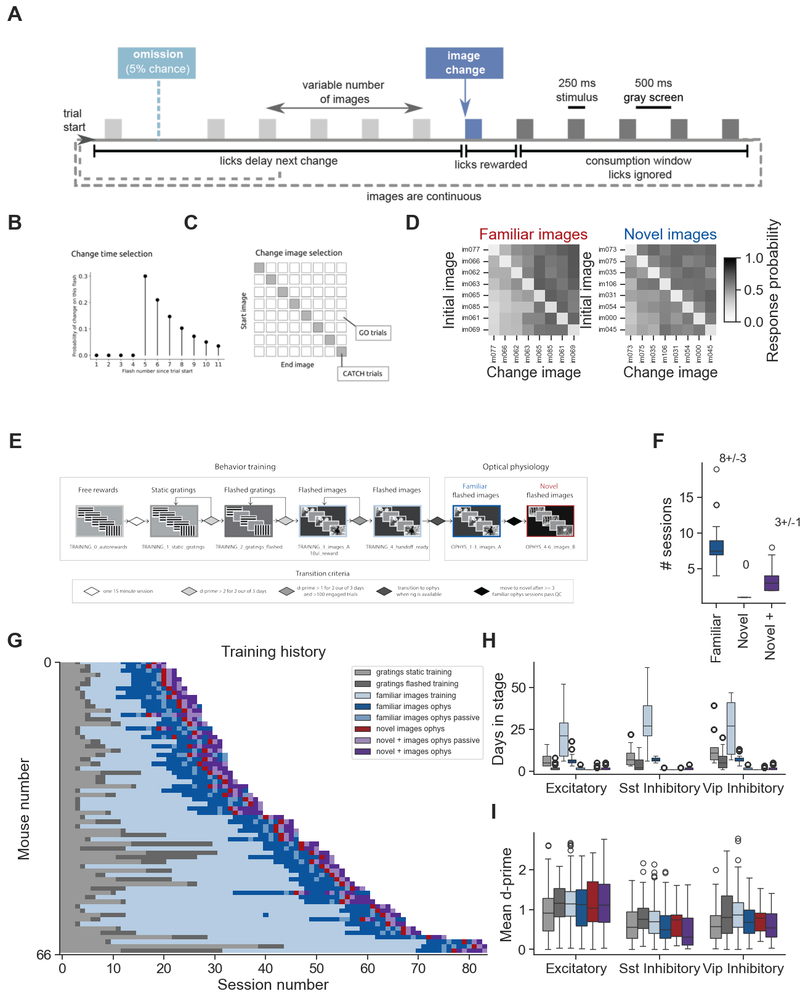

In [110]:
# Composite Figure S3 - Go/no-go visual change detection task and training procedure
#   A task flow | B/C change-time & trial-types | D response-prob heatmaps
#   E training-stages | F stimulus exposure | G training history | H days in stage | I mean d-prime
# Loaded .png panels (A,B/C,E) use aspect='equal'; each panel region is sized to the image's true
# aspect so it fills the space. Panel letters anchor to each panel's REGION (not the content axis),
# so they don't drift when an image/heatmap axis shrinks. A/B/E/G left edges share x=0.04 -> aligned.
import os
colors = utils.get_experience_level_colors()
figsize = (16, 20)
fig = plt.figure(figsize=figsize)

def panel_label(ax, label, dx=-44, dy=12):
    ax.annotate(label, xy=(0, 1), xycoords='axes fraction', xytext=(dx, dy), textcoords='offset points',
                fontsize=24, fontweight='bold', va='bottom', ha='right', annotation_clip=False)

def label_region(xspan, yspan, label):
    # invisible full-region axis used only to anchor the panel letter to the region's top-left
    axl = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=xspan, yspan=yspan)
    axl.axis('off')
    panel_label(axl, label)

_schematics_root = '/Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/schematics'
def _resolve_schematics_dir():
    for sub in ['Figure 2', 'figure_2', 'Figure2', 'figure 2', 'Figure_2', 'fig2', '']:
        d = os.path.join(_schematics_root, sub)
        if os.path.isdir(d):
            return d
    return _schematics_root
_schematics_dir = _resolve_schematics_dir()

def image_panel(x0, x1, y0, label, filename, fallback_h=0.12):
    """Place an image with aspect='equal'; size the panel region (top-anchored at y0) to the
    image's true aspect so it fills. Returns the panel's bottom y (figure fraction)."""
    p = os.path.join(_schematics_dir, filename)
    if os.path.exists(p):
        img = plt.imread(p)
        h = (x1 - x0) * (figsize[0] / figsize[1]) * (img.shape[0] / img.shape[1])
        ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[x0, x1], yspan=[y0, y0 + h])
        ax.axis('off')
        ax.imshow(img)  # default aspect='equal' -> proportional pixels
        ax.set_anchor('NW')  # keep the image at the top-left of its region (next to the panel label)
    else:
        print('schematic not found:', p)
        try:
            print('  files in', _schematics_dir, '->', sorted(os.listdir(_schematics_dir)))
        except Exception:
            pass
        h = fallback_h
        ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[x0, x1], yspan=[y0, y0 + h])
        ax.axis('off')
        ax.text(0.5, 0.5, '[' + filename + ']', ha='center', va='center', fontsize=9, color='0.6', transform=ax.transAxes)
    label_region([x0, x1], [y0, y0 + h], label)
    return y0 + h

# ---- Row A: task flow (full width) ----
yA = image_panel(0.04, 0.99, 0.02, 'A', 'task_flow.png')

# ---- Row B/C (left, one image) + D heatmaps (right), tops aligned at y2 ----
y2 = yA + 0.04
yBC = image_panel(0.04, 0.36, y2, 'B', 'change_time_trial_types.png')
label_region([0.22, 0.36], [y2, y2 + 0.02], 'C')   # C is the right sub-part of the same image

hD = 0.20
ax_D = utils.placeAxesOnGrid(fig, dim=[1, 2], xspan=[0.44, 0.90], yspan=[y2, y2 + hD], wspace=0.35)
try:
    ppf.plot_response_probability_heatmaps_for_cohorts(behavior_sessions, axes=ax_D)  # colorbar added below
    for _a in ax_D:
        _a.set_anchor('N')           # top-align the square heatmaps so they sit near the panel label
        _a.tick_params(labelsize=8)  # ticks +1
        _a.xaxis.label.set_fontsize(max(_a.xaxis.label.get_fontsize() - 1, 1))  # x/y labels -1
        _a.yaxis.label.set_fontsize(max(_a.yaxis.label.get_fontsize() - 1, 1))
    # colorbar in its own axis, ~0.7 of the (rendered) heatmap height so it is no taller than them
    fig.canvas.draw()
    _pos = ax_D[1].get_position()
    _cax = fig.add_axes([_pos.x1 + 0.008, _pos.y0 + _pos.height * 0.15, 0.012, _pos.height * 0.7])
    _cb = fig.colorbar(ax_D[1].collections[0], cax=_cax)
    _cb.set_label('Response probability')
except Exception as _e:
    print('Panel D (response-probability heatmaps) skipped:', repr(_e))
    for _a in ax_D:
        _a.clear(); _a.axis('off')
    ax_D[0].text(1.05, 0.5, '[response-probability heatmaps unavailable]', ha='center', va='center',
                 fontsize=10, color='0.6', transform=ax_D[0].transAxes)
label_region([0.40, 0.92], [y2, y2 + 0.02], 'D')

# ---- Row E (left image) + F (right plot), taller row ----
y3 = max(yBC, y2 + hD) + 0.05
yE = image_panel(0.04, 0.80, y3, 'E', 'training_stages.png')
ax_F = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[0.85, 0.98], yspan=[y3, yE])
ppf.plot_total_stimulus_exposures(behavior_sessions_local, save_dir=None, ax=ax_F)
ax_F.set_title('')  # drop the overlapping title
panel_label(ax_F, 'F')

# ---- Row G (left, narrower) + H/I (right, moved left + wider) ----
y4 = yE + 0.06
ax_G = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[0.04, 0.60], yspan=[y4, 0.99])
ppf.plot_training_history_for_mice(behavior_sessions_local, color_column='behavior_stage',
                                   color_map=utils.get_behavior_stage_color_map(as_rgb=True),
                                   group_by_cre_line=False, save_dir=None, ax=ax_G)
panel_label(ax_G, 'G')

hi_h = (0.99 - y4 - 0.06) / 2.0
ax_H = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[0.66, 0.99], yspan=[y4, y4 + hi_h])
ppf.plot_days_in_stage(behavior_sessions_local, 'behavior_stage', ax=ax_H)
panel_label(ax_H, 'H')
# shared stage legend -> G's blank lower-right, underscores stripped, removed from H
_handles, _labels = ax_H.get_legend_handles_labels()
_labels = [s.replace('_', ' ') for s in _labels]
if ax_H.get_legend() is not None:
    ax_H.get_legend().remove()
if _handles:
    ax_G.legend(_handles, _labels, loc='upper right', bbox_to_anchor=(1.0, 1.0),
                fontsize=9, frameon=True, borderaxespad=0.5)

ax_I = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[0.66, 0.99], yspan=[y4 + hi_h + 0.06, 0.99])
_data = behavior_stats_sdk.copy()
_data = _data[_data['mean_dprime'] > 0]
ppf.plot_behavior_metric_across_stages(_data, 'mean_dprime', ylabel='Mean d-prime', ax=ax_I)
if ax_I.get_legend() is not None:
    ax_I.get_legend().remove()
panel_label(ax_I, 'I')

utils.save_figure(fig, figsize, save_dir, 'composite', 'figure_S3_composite')


## Figure S4 composite

Selection criteria & task performance. B (stimulus exposure F/N/N+), C (novel sessions prior to Novel+), D (cohort table) and E (imaging depth) are left blank -- B/C/E have no plot in this notebook and D is a table; A and F-I are produced here.

402


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [11..256].
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7494: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(data=exposures, x='experience_level', y='prior_exposures_to_image_set',
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7503: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(experience_levels, rotation=90)
/Users/marinag/Documents/Code/visual_behavior_analysis/visual_behavior/visualization/ophys/platform_paper_figures.py:7565: FutureWarning: 

Passing `palette` without as

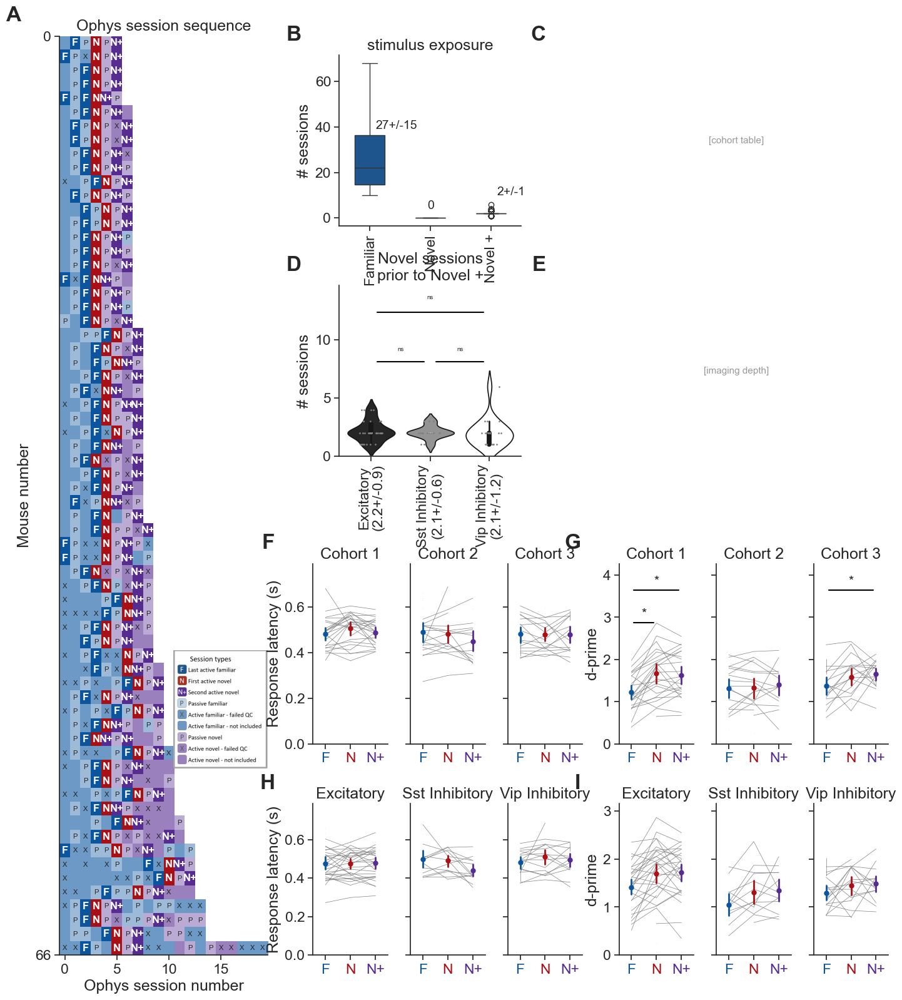

In [111]:
# Composite Figure S4 - Selection criteria and task performance (Familiar / Novel / Novel+)
#   A ophys session sequence (full height, left; inset session-types legend)
#   B prior exposures to image set   C prior exposures per cell type   D cohort table [blank]   E imaging depth [blank]
#   F latency by cohort  G d-prime by cohort  H latency by cell type  I d-prime by cell type  (all to the right of A)
import os
colors = utils.get_experience_level_colors()
figsize = (18, 18)
fig = plt.figure(figsize=figsize)

def panel_label(ax, label, dx=-44, dy=12):
    ax.annotate(label, xy=(0, 1), xycoords='axes fraction', xytext=(dx, dy), textcoords='offset points',
                fontsize=24, fontweight='bold', va='bottom', ha='right', annotation_clip=False)

def blank_panel(xspan, yspan, label, note=''):
    ax = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=xspan, yspan=yspan)
    ax.set_xticks([]); ax.set_yticks([])
    for sp in ax.spines.values():
        sp.set_visible(False)
    if note:
        ax.text(0.5, 0.5, note, ha='center', va='center', fontsize=11, color='0.6', transform=ax.transAxes)
    panel_label(ax, label)
    return ax

_schematics_root = '/Users/marinag/Library/CloudStorage/Dropbox/JupyterNotebooks/FinalDataAssetsforCodeOcean/schematics'
def _find_schematic(filename):
    for sub in ['Figure 2', 'figure_2', 'Figure2', 'figure 2', 'Figure_2', 'fig2', '']:
        p = os.path.join(_schematics_root, sub, filename)
        if os.path.exists(p):
            return p
    return None

# A: ophys session sequence (platform mice) -- full height, left column
ax_A = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[0.04, 0.28], yspan=[0.02, 0.98])
import visual_behavior.data_access.utilities as da_utils
_sessions = da_utils.add_ophys_stage_to_behavior_sessions(platform_experiments, behavior_sessions)
_sessions = _sessions[_sessions.ophys_stage != 'None']
_sessions = _sessions[_sessions.mouse_id.isin(platform_experiments.mouse_id.unique())]
ppf.plot_ophys_history_for_mice(_sessions, color_column='ophys_stage',
                                color_map=utils.get_ophys_stage_color_map(as_rgb=True),
                                label_with_mouse_id=False, save_dir=None, ax=ax_A)
panel_label(ax_A, 'A')

# A inset legend (session types) loaded from png -- placed in A's lower-right empty area
ax_leg = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[0.17, 0.28], yspan=[0.66, 0.95])
ax_leg.axis('off')
_legp = _find_schematic('session_types_legend.png')
if _legp is not None:
    ax_leg.imshow(plt.imread(_legp))
    ax_leg.set_anchor('NE')
else:
    print('session_types_legend.png not found')
    ax_leg.text(0.5, 0.5, '[session_types_legend.png]', ha='center', va='center', fontsize=8, color='0.6',
                transform=ax_leg.transAxes)

# B: prior exposures to image set before platform ophys sessions
ax_B = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[0.36, 0.52], yspan=[0.04, 0.22])
ppf.plot_prior_exposures_to_image_set_before_platform_ophys_sessions(
    platform_experiments, behavior_sessions_local, save_dir=None, ax=ax_B)
panel_label(ax_B, 'B')

# D: cohort table (not yet saved as a png) -- blank (top-right, wider)
blank_panel([0.55, 0.99], [0.04, 0.22], 'D', '[cohort table]')

# C: prior exposures per cell type for Novel+ (mid-left)
ax_C = utils.placeAxesOnGrid(fig, dim=[1, 1], xspan=[0.36, 0.55], yspan=[0.28, 0.46])
ppf.plot_prior_exposures_per_cell_type_for_novel_plus(
    platform_experiments, behavior_sessions_local, save_dir=None, ax=ax_C)
panel_label(ax_C, 'C')

# E: imaging depth (from Fig 1 supplemental) -- blank for now (widened)
blank_panel([0.55, 0.99], [0.28, 0.46], 'E', '[imaging depth]')

# helper: 1x3 by-group metric row; share y, ylabel + yticklabels only on the leftmost axis
def _metric_row(axarr, stats, metric, ylabel, ylims, group_col, groups, title_fmt):
    stats = stats.copy()
    stats = stats[stats.behavior_session_id.isin(platform_experiments.behavior_session_id.unique())]
    if 'dprime' in metric:
        stats = stats[stats[metric] > 0]
    stats['ophys_container_id'] = stats['mouse_id']
    for i, g in enumerate(groups):
        tmp = stats[stats[group_col] == g]
        ppf.plot_behavior_metric_by_experience(tmp, metric, title=title_fmt(i, g),
                                               ylabel=(ylabel if i == 0 else ''), ylims=ylims,
                                               best_image=False, show_mice=True, plot_stats=True, stripplot=False,
                                               show_ns=False, save_dir=None, ax=axarr[i])
        axarr[i].set_title(title_fmt(i, g))
        if i > 0:
            axarr[i].set_ylabel('')
            axarr[i].tick_params(labelleft=False)  # sharey -> hide yticklabels on non-left axes

# F-I moved down so H/I bottom (xaxis) aligns with A's bottom (0.98); wider + taller; more wspace
ax_F = utils.placeAxesOnGrid(fig, dim=[1, 3], xspan=[0.36, 0.63], yspan=[0.58, 0.76], wspace=0.3, sharey=True)
_metric_row(ax_F, stim_stats_ophys_engaged, 'response_latency_mean', 'Response latency (s)', (0, 0.7),
            'project_code', project_codes, lambda i, g: 'Cohort ' + str(i + 1))
panel_label(ax_F[0], 'F')

ax_G = utils.placeAxesOnGrid(fig, dim=[1, 3], xspan=[0.66, 0.99], yspan=[0.58, 0.76], wspace=0.3, sharey=True)
_metric_row(ax_G, stim_stats_ophys, 'mean_dprime_engaged', 'd-prime', (0, 2.8),
            'project_code', project_codes, lambda i, g: 'Cohort ' + str(i + 1))
panel_label(ax_G[0], 'G')

ax_H = utils.placeAxesOnGrid(fig, dim=[1, 3], xspan=[0.36, 0.63], yspan=[0.82, 0.98], wspace=0.3, sharey=True)
_metric_row(ax_H, stim_stats_ophys_engaged, 'response_latency_mean', 'Response latency (s)', (0, 0.7),
            'cell_type', cell_types, lambda i, g: g)
panel_label(ax_H[0], 'H')

ax_I = utils.placeAxesOnGrid(fig, dim=[1, 3], xspan=[0.66, 0.99], yspan=[0.82, 0.98], wspace=0.3, sharey=True)
_metric_row(ax_I, stim_stats_ophys, 'mean_dprime_engaged', 'd-prime', (0, 2.8),
            'cell_type', cell_types, lambda i, g: g)
panel_label(ax_I[0], 'I')

utils.save_figure(fig, figsize, save_dir, 'composite', 'figure_S4_composite')
